In [ ]:
#!pip install pandas shap xgboost scikit-learn
#!pip install statannot
!pip install statannot
!pip install scikit-optimize
!pip install shap
#!pip install scikit-learn==1.2.2 # Downgrade scikit-learn to version 1.2.2 to resolve compatibility issues.


import pandas as pd
import shap
import xgboost as xgb
from sklearn.model_selection import train_test_split
import shap
import xgboost as xgb
from sklearn.model_selection import train_test_split

from __future__ import division
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBClassifier
#import pandas as pd
import numpy as np
import re
import pickle
import matplotlib.pyplot as plt
from xgboost import plot_importance
import plotly.graph_objects as go
from tqdm.notebook import tqdm
from sklearn.model_selection import RepeatedKFold
import xgboost as xgb
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, accuracy_score, recall_score, precision_score, confusion_matrix, mean_squared_error
import seaborn as sns
from statannot import add_stat_annotation
from sklearn.linear_model import Lasso, MultiTaskLasso, Ridge, ElasticNet

from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import mutual_info_regression, f_regression

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.decomposition import PCA

from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler

from sklearn import metrics


from skopt import BayesSearchCV
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNet

import statsmodels.api as sm

import time

import scipy

from sklearn.svm import SVR

from skopt import BayesSearchCV
from sklearn.ensemble import RandomForestRegressor

from statsmodels.stats.multitest import fdrcorrection

from statsmodels.stats import multitest

from sklearn.linear_model import RidgeCV, LassoCV, Ridge, Lasso
from sklearn.ensemble import ExtraTreesClassifier

from collections import Counter
import heapq

import statsmodels.api as sm

from sklearn.ensemble import RandomForestRegressor

import re

from sklearn.preprocessing import MinMaxScaler

import os

import pandas as pd
from sklearn.utils import resample
from sklearn.cluster import KMeans


In [ ]:
def determinar_intervalo(min_val, max_val, x):


    pasos = np.linspace(min_val, max_val, 7)

    if(max_val == x):
        return 6

    for i in range(7):
        if pasos[i] <= x < pasos[i+1]:
            return (i)
    return None

def rgba_to_hex(rgba):

    return "#{:02X}{:02X}{:02X}".format(rgba[0], rgba[1], rgba[2])

color_hex = rgba_to_hex(color_rgba)
print(color_hex)


educ_palete = ['#cdffff', '#abe5eb',  '#8acbd8', '#6bb1c6', '#4c98b5', '#2d7fa3', '#006691']
sex_palete = ['#fffff1', '#fcfade',  '#faf5cb', '#f8f0b8', '#f7eaa5', '#f7e492', '#f8de7e']
age_palete = ['#98ffe0', '#80e4c4',  '#69caa8', '#52b18d', '#3b9873', '#23805a', '#026842']
MMSE_palete = ['#ff9ea2', '#f0888b',  '#e07275', '#d05b5f', '#bf4549', '#ae2c34', '#9c0720']
GINI_palete = ['#ffd5bd', '#ffbe99',  '#ffa777', '#fd8f56', '#f87734', '#ff5e00', '#f25c05']

#FF0000


In [ ]:
from scipy.stats import linregress, combine_pvalues
from sklearn.model_selection import train_test_split, RepeatedKFold
import xgboost as xgb
import numpy as np
import pandas as pd
import plotly.graph_objs as go
from tqdm import tqdm

def classifier_ROC(X_, y, diagnosis, fig_show=True, params_=None):


    X_train, X_test, y_train, y_test = train_test_split(X_, y, test_size=0.2, random_state=6000, stratify=diagnosis)
    print(X_train,y_train)

    n_splits=7 #10
    n_repeats=10#2

    cv = RepeatedKFold(n_splits=n_splits, n_repeats=n_repeats, random_state=101)
    folds = [(train, test) for train, test in cv.split(X_train, y_train)]
    metrics = ['auc', 'fpr', 'tpr', 'thresholds', 'f1_score', 'accuracy_score', 'recall_score', 'precision_score', 'confusion_matrix', 'model']
    results = {
        'train': {m: [] for m in metrics},
        'val': {m: [] for m in metrics},
        'test': {m: [] for m in metrics}
    }
    X_train = pd.DataFrame(X_train)
    y_train = pd.DataFrame(y_train)

    if params_ is not None:
        params = params_
    else:
        params = {
            'objective': 'binary:logistic',
            'eval_metric': 'logloss',
            #'max_depth': 5,
            #'learning_rate': 0.1,
            #'subsample': 0.8,
            #'lambda': 1,
            #'alpha': 0,  #
            #'tree_method': 'hist',  #
            #'device': 'cuda'  #
            }

    plt.rcParams["figure.figsize"] = (10, 10)
    dtest = xgb.DMatrix(X_test, label=y_test)

    all_p_values = {feature: [] for feature in X_train.columns}
    slopes = {feature: [] for feature in X_train.columns}
    correlations = {feature: [] for feature in X_train.columns}
    intercepts = {feature: [] for feature in X_train.columns}
    directions = {feature: [] for feature in X_train.columns}
    r_squared = {feature: [] for feature in X_train.columns}
    t_values = {feature: [] for feature in X_train.columns}
    f_values = {feature: [] for feature in X_train.columns}
    f_p_values = {feature: [] for feature in X_train.columns}
    r_values = {feature: [] for feature in X_train.columns}
    cohen_f2_values = {feature: [] for feature in X_train.columns}


    #slopes = []
    #intercepts = []
    #directions = []

    # Inicializar una estructura de datos para almacenar los p-values de cada iteración
    p_values_per_iteration = {feature: [] for feature in X_train.columns}

    for train_idx, test_idx in tqdm(folds, total=len(folds)):
        dtrain = xgb.DMatrix(X_train.iloc[train_idx, :], label=y_train.iloc[train_idx])
        dval = xgb.DMatrix(X_train.iloc[test_idx, :], label=y_train.iloc[test_idx])
        model = xgb.train(
            dtrain=dtrain,
            params=params,
            evals=[(dtrain, 'train'), (dval, 'val')],
            num_boost_round=1000,
            verbose_eval=False,
            early_stopping_rounds=10,
        )
        last_model = model
        sets = [dtrain, dval, dtest]

        for i, ds in enumerate(results.keys()):
            y_preds = model.predict(sets[i])
            labels = sets[i].get_label()
            fpr, tpr, thresholds = roc_curve(labels, y_preds)
            results[ds]['fpr'].append(fpr)
            results[ds]['tpr'].append(tpr)
            results[ds]['thresholds'].append(thresholds)
            results[ds]['auc'].append(roc_auc_score(labels, y_preds))

            results[ds]['f1_score'].append(f1_score(labels, np.round(y_preds)))
            results[ds]['accuracy_score'].append(accuracy_score(labels, np.round(y_preds)))
            results[ds]['recall_score'].append(recall_score(labels, np.round(y_preds)))
            results[ds]['precision_score'].append(precision_score(labels, np.round(y_preds)))
            results[ds]['confusion_matrix'].append(confusion_matrix(labels, np.round(y_preds)))
            results[ds]['model'].append(model)


        # significancia para cada iteración
        for feature in X_train.columns:
            X_feature = X_train[feature].iloc[train_idx].values
            y_train_squeezed = y_train.iloc[train_idx].squeeze().values

            if len(X_feature) == len(y_train_squeezed):
                slope, intercept, r_value, p_value, std_err = linregress(X_feature, y_train_squeezed)
                all_p_values[feature].append(p_value)

                slopes[feature].append(slope)
                correlations[feature].append(r_value)
                intercepts[feature].append(intercept)

                directions[feature].append(1 if slope > 0 else -1)


                aux=r_value**2
                r_squared[feature].append(aux)

                r_values[feature].append(r_value)


                cohen_f2 = (aux / (1 - aux))
                cohen_f2_values[feature].append(cohen_f2)


                X_feature_with_const = sm.add_constant(X_feature)
                model = sm.OLS(y_train_squeezed, X_feature_with_const).fit()


                t_values[feature].append(model.tvalues[1])
                f_values[feature].append(model.fvalue)
                f_p_values[feature].append(model.f_pvalue)

            else:
                print(f" {feature}: {len(X_feature)} vs {len(y_train_squeezed)}")


    combined_p = {feature: combine_pvalues(all_p_values[feature], method='fisher')[1] for feature in X_train.columns}


    average_slopes = {feature: np.mean([slope for slope in slopes[feature] if slope]) for feature in X_train.columns}

    average_correlations = {feature: np.mean([correlation for correlation in correlations[feature] if correlation]) for feature in correlations}


    average_directions = {}
    for feature in X_train.columns:
        avg_direction = np.mean(directions[feature])
        if avg_direction > 0:
            average_directions[feature] = 1
        else:
            average_directions[feature] = -1

    average_r_squared = {feature: np.mean([r2 for r2 in r_squared[feature] if r2]) for feature in X_train.columns}
    average_t_values = {feature: np.mean([t for t in t_values[feature] if t]) for feature in X_train.columns}
    average_f_values = {feature: np.mean([f for f in f_values[feature] if f]) for feature in X_train.columns}
    average_f_p_values = {feature: np.mean([fp for fp in f_p_values[feature] if fp]) for feature in X_train.columns}
    average_cohen_f2_values = {feature: np.mean([fp for fp in cohen_f2_values[feature] if fp]) for feature in X_train.columns}
    average_r_values = {feature: np.mean([r for r in r_values[feature] if r]) for feature in X_train.columns}


    kind = 'test'
    c_fill = 'rgba(52, 152, 219, 0.2)'
    c_line = 'rgba(52, 152, 219, 0.5)'
    c_line_main = 'rgba(41, 128, 185, 1.0)'
    c_grid = 'rgba(189, 195, 199, 0.5)'
    c_annot = 'rgba(149, 165, 166, 0.5)'
    c_highlight = 'rgba(192, 57, 43, 1.0)'

    fpr_mean = np.linspace(0, 1, 100)
    interp_tprs = []

    for i in range(n_splits * n_repeats):
        fpr = results[kind]['fpr'][i]
        tpr = results[kind]['tpr'][i]
        interp_tpr = np.interp(fpr_mean, fpr, tpr)
        interp_tpr[0] = 0.0
        interp_tprs.append(interp_tpr)

    tpr_mean = np.mean(interp_tprs, axis=0)
    tpr_mean[-1] = 1.0
    tpr_std = 2 * np.std(interp_tprs, axis=0)
    tpr_upper = np.clip(tpr_mean + tpr_std, 0, 1)
    tpr_lower = tpr_mean - tpr_std
    auc = np.mean(results[kind]['auc'])

    roc_dict = {}
    roc_dict['tpr_mean'] = tpr_mean
    roc_dict['tpr_std'] = tpr_std
    roc_dict['tpr_upper'] = tpr_upper
    roc_dict['tpr_lower'] = tpr_lower
    roc_dict['auc'] = auc


    results_ = {}
    results_[0] = model
    results_[1] = results
    results_[2] = np.round(auc, 2)
    results_[3] = roc_dict

    shap.initjs()

    dmatrix_full = xgb.DMatrix(X_, label=y)
    model_final = xgb.train(
        dtrain=dmatrix_full,
        params=params,
        num_boost_round=1000,
        verbose_eval=False
    )

    explainer = shap.TreeExplainer(model_final)
    shap_values = explainer.shap_values(X_)

    shap.summary_plot(shap_values, X_, plot_type="bar")

    dmatrix_test_full = xgb.DMatrix(X_test)
    shap_values_test = explainer.shap_values(X_test)
    shap.summary_plot(shap_values_test, X_test)

    shap_df = pd.DataFrame(shap_values, columns=X_.columns)
    shap_df['Predictions'] = model_final.predict(dmatrix_full)
    shap_df['Actual Labels'] = y
    print(shap_df.head())


    if isinstance(shap_values, list):
        for i in range(len(shap_values)):
            shap.summary_plot(shap_values[i], X_, plot_type="beeswarm", title=f"Class {i}")
    else:
        shap.summary_plot(shap_values, X_, plot_type="beeswarm")



    if fig_show:
        fig = go.Figure([
            go.Scatter(
                x=fpr_mean,
                y=tpr_upper,
                line=dict(color=c_line, width=1),
                hoverinfo="skip",
                showlegend=False,
                name='upper'),
            go.Scatter(
                x=fpr_mean,
                y=tpr_lower,
                fill='tonexty',
                fillcolor=c_fill,
                line=dict(color=c_line, width=1),
                hoverinfo="skip",
                showlegend=False,
                name='lower'),
            go.Scatter(
                x=fpr_mean,
                y=tpr_mean,
                line=dict(color=c_line_main, width=2),
                hoverinfo="skip",
                showlegend=True,
                name=f'AUC: {auc:.3f}')
        ])

        fig.add_shape(
            type='line',
            line=dict(dash='dash'),
            x0=0, x1=1, y0=0, y1=1
        )

        fig.update_layout(
            template='plotly_white',
            title_x=0.5,
            xaxis_title="1 - Specificity",
            yaxis_title="Sensitivity",
            width=800,
            height=800,
            legend=dict(
                yanchor="bottom",
                xanchor="right",
                x=0.95,
                y=0.01,
            )
        )

        fig.update_yaxes(
            range=[0, 1],
            gridcolor=c_grid,
            scaleanchor="x",
            scaleratio=1,
            linecolor='black')

        fig.update_xaxes(
            range=[0, 1],
            gridcolor=c_grid,
            constrain='domain',
            linecolor='black')

        fig.show()


    else:
        print(y.name, 'AUC: ', np.round(auc, 2), '+-( ', np.round(np.std(results[kind]['auc']), 2), ')', X_.shape)


    results = {}
    results['results_'] = results_
    results['combined_p'] = combined_p
    results['slopes'] = average_slopes
    results['directions'] = average_directions
    results['intercepts'] = intercepts
    results['correlations'] = average_correlations
    results['rsquared'] = average_r_squared
    results['average_t_values']=average_t_values
    results['fvalues'] = average_f_values
    results['fpvalues']=average_f_p_values
    results['cohenf2values']=average_cohen_f2_values
    results['average_r_values']=average_r_values
    results['slopes_todo']=slopes


    return results


In [ ]:
from skopt import BayesSearchCV
def SearchBestModel(case_x, case_y):

    X_train, X_test, y_train, y_test = train_test_split(case_x, case_y, test_size=.2, random_state=1)

    opt_XGB = BayesSearchCV(
            XGBClassifier(tree_method='hist',device='cuda'),
            {
                'objective'   : ['binary:logistic'],
                'eval_metric' : ['logloss', 'error', 'auc', 'aucpr'],
                'learning_rate': (0.01, 0.1, 0.2),
                'max_depth': (3, 4, 5),
                'subsample': (0.7,0.8, 0.9, 1.0),
                'colsample_bytree': (0.7,0.8, 0.9, 1.0),
                'reg_alpha': (0, 0.1,0.5,1.0),
                'reg_lambda': (0, 0.1,0.5, 1.0),
                #'gamma': (0.001, 0.01, 0.1, 1, 10),

            },

            #n_iter=10,
            #cv=3,
            random_state=1
        )

    opt_XGB.fit(X_train, y_train)


    print('XGB')
    print("val. score: %s" % opt_XGB.best_score_)
    print("test score: %s" % opt_XGB.score(X_test, y_test))
    print("best parameters: %s" % str(opt_XGB.best_params_))
    print('---------------------------------------------\n')

    return opt_XGB

In [ ]:

compl_df = pd.read_excel(f'Data/connectiivity_normalized.xlsx')


compl_df.columns = compl_df.columns.to_series().apply(lambda x: x.strip())

columns_to_convert = compl_df.columns.difference(['Sex', 'Diagnosis','Region'])
compl_df[columns_to_convert] = compl_df[columns_to_convert].astype(float)
compl_df

def map_diagnosis(value):
    if value == 0.95:
        return 1
    elif value == 0.05:
        return 0
    else:
        return value

compl_df['Diagnosis'] = compl_df['Diagnosis'].apply(map_diagnosis)


conn_df = compl_df.copy()


pd.set_option('display.max_rows', 10)


compl_df


,transitivity_mimat,transitivity_cmimat,transitivity_omat,global_efficiency_mimat,global_efficiency_cmimat,global_efficiency_omat,small_worldness_mimat,small_worldness_cmimat,small_worldness_omat,Region,Age,Sex,Educ,MMSE,GINI,ODQ,Diagnosis
0,0.471715,0.045267,0.001169,0.463862,0.035617,-3.200373e-08,0.651515,0.016767,0.000061,ARG,0.64625,0.05,0.153846,0.709333,0.195795,0.95,1
1,0.443544,0.025292,0.001092,0.436094,0.045818,-2.738816e-08,0.623600,0.016390,0.000055,ARG,0.64625,0.95,0.257692,0.741333,0.195795,0.95,1
2,0.462128,0.044352,0.001216,0.454741,0.138174,-3.106235e-08,0.642024,0.039298,0.000063,ARG,0.74750,0.95,0.257692,0.704000,0.195795,0.95,1
3,0.446623,0.031444,0.001127,0.440220,0.065176,3.971575e-05,0.624367,0.018480,0.000059,ARG,0.66875,0.95,0.465385,0.720000,0.195795,0.95,1
4,0.461157,0.037181,0.001142,0.454450,0.022880,-3.030250e-08,0.639915,0.012693,0.000058,ARG,0.77000,0.05,0.465385,0.527333,0.190587,0.95,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
953,0.476927,0.081400,0.001675,0.472273,0.214338,1.878763e-04,0.644475,0.068464,0.000092,Turkey,0.64625,0.05,0.223077,0.916667,0.192822,0.95,0
954,0.456112,0.049720,0.001571,0.450933,0.035187,1.686555e-05,0.629617,0.012860,0.000084,Turkey,0.61250,0.05,0.846154,0.950000,0.192822,0.95,0
955,0.478014,0.093093,0.001589,0.474107,0.230614,8.269996e-05,0.642178,0.087306,0.000089,Turkey,0.57875,0.05,0.569231,0.950000,0.192822,0.95,0
956,0.446355,0.077737,0.001549,0.441763,0.203232,6.206012e-05,0.616460,0.078046,0.000087,Turkey,0.70250,0.95,0.569231,0.950000,0.192822,0.95,0


In [ ]:
outcomes_list = list(conn_df.iloc[:,0:-8])
df_metrics_slopes = pd.DataFrame(columns=outcomes_list)
df_metrics_pval = pd.DataFrame(columns=outcomes_list)
df_metrics_dir = pd.DataFrame(columns=outcomes_list)
df_metrics_slopes
outcomes_list

['transitivity_mimat',
 'transitivity_cmimat',
 'transitivity_omat',
 'global_efficiency_mimat',
 'global_efficiency_cmimat',
 'global_efficiency_omat',
 'small_worldness_mimat',
 'small_worldness_cmimat',
 'small_worldness_omat']

In [ ]:

compl_df_mod = conn_df.copy()

Processing outcome: transitivity_mimat


/usr/local/lib/python3.12/dist-packages/xgboost/core.py:774: UserWarning: [15:42:46] WARNING: /workspace/src/common/error_msg.cc:62: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  return func(**kwargs)


XGB
val. score: 0.8107546048722518
test score: 0.8177083333333334
best parameters: OrderedDict({'colsample_bytree': 0.9, 'eval_metric': 'error', 'learning_rate': 0.01, 'max_depth': 5, 'objective': 'binary:logistic', 'reg_alpha': 1.0, 'reg_lambda': 0.1, 'subsample': 0.9})
---------------------------------------------

         GINI      Age      Educ   Sex      MMSE  Diagnosis   ODQ
125  0.365066  0.71375  0.430769  0.05  0.616667          1  0.95
17   0.211420  0.74750  0.638462  0.05  0.683333          1  0.95
24   0.211420  0.64625  0.500000  0.95  0.683333          1  0.95
82   0.337722  0.77000  0.223077  0.95  0.616667          1  0.95
921  0.192822  0.75875  0.430769  0.95  0.850000          0  0.95
..        ...      ...       ...   ...       ...        ...   ...
776  0.209525  0.68000  0.223077  0.95  0.883333          0  0.65
818  0.188459  0.62375  0.223077  0.95  0.883333          0  0.65
362  0.337547  0.62375  0.430769  0.05  0.916667          0  0.65
804  0.209525  0.5225

100%|██████████| 70/70 [00:04<00:00, 16.74it/s]


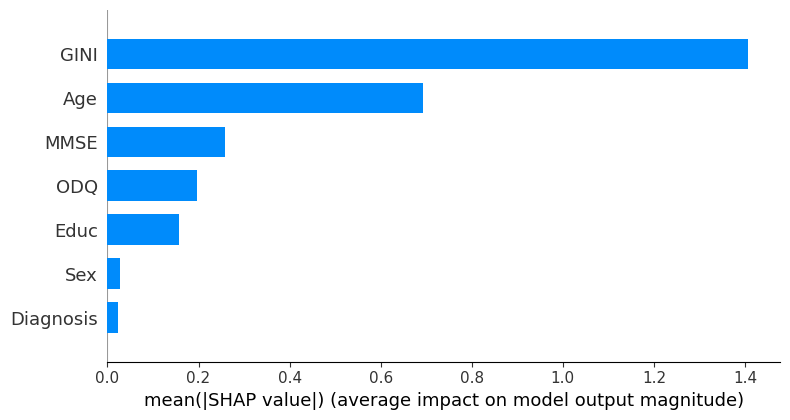

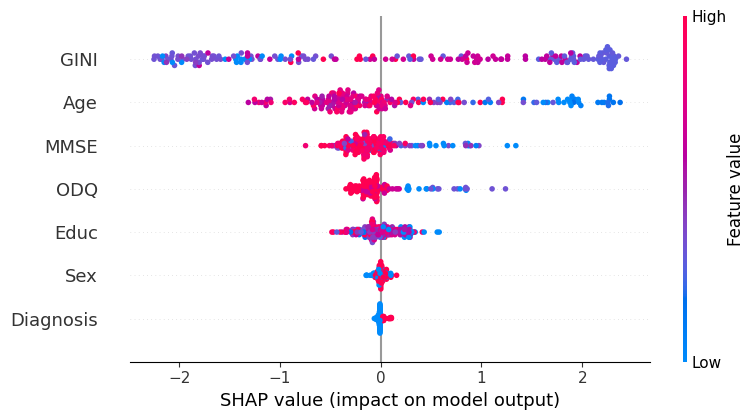

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -0.130774 -0.204180 -0.003846 -0.016407  0.228385   0.014075 -0.206677   
1 -0.165847 -0.393380  0.004888  0.010186 -0.313574   0.011927 -0.236363   
2 -0.148141 -0.111778  0.289961  0.081945  0.287253   0.018547 -0.213189   
3 -0.213463 -0.380075 -0.104597  0.010296 -0.276620   0.018987 -0.289130   
4  0.618867 -0.054756  0.114001 -0.145625  0.368769   0.020091 -0.065494   

   Predictions  Actual Labels  
0     0.419610              1  
1     0.252162              0  
2     0.549747              1  
3     0.224514              0  
4     0.700757              1  


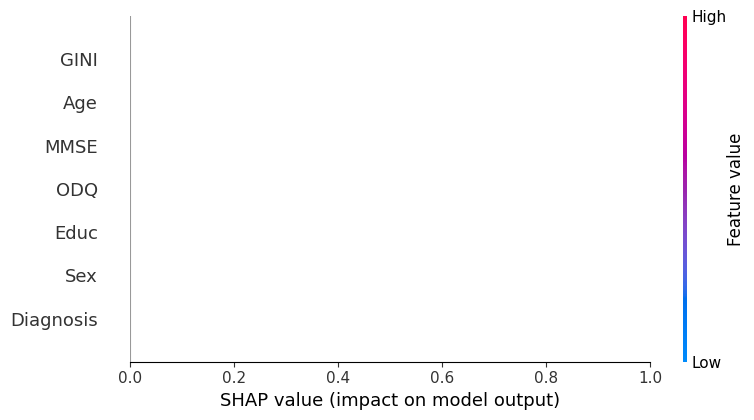

transitivity_mimat_b AUC:  0.86 +-(  0.01 ) (958, 7)

salidaaa: 0.227 (0.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)                None              None   
Age                     None                None              None   
Educ                    None                None              None   
Sex                     None                None              None   
MMSE                    None                None              None   
Diagnosis               None                None              None   
ODQ                     None                None              None   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                         None                     None   
Age                          None                     None   
Educ                         None                     None   
Sex                          None                     None   
MMSE                         None            

100%|██████████| 70/70 [00:18<00:00,  3.69it/s]


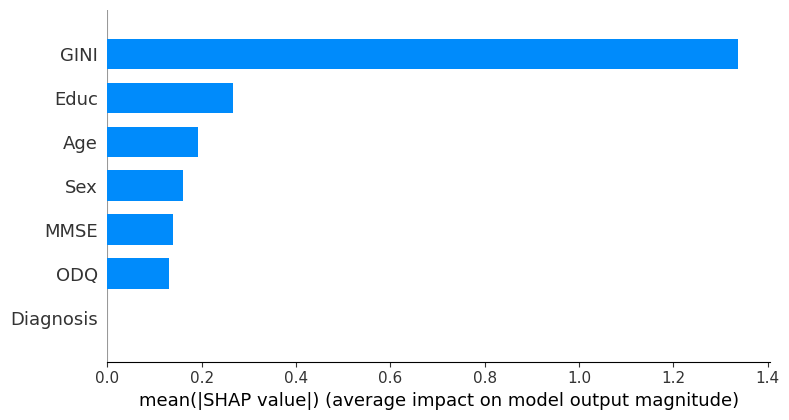

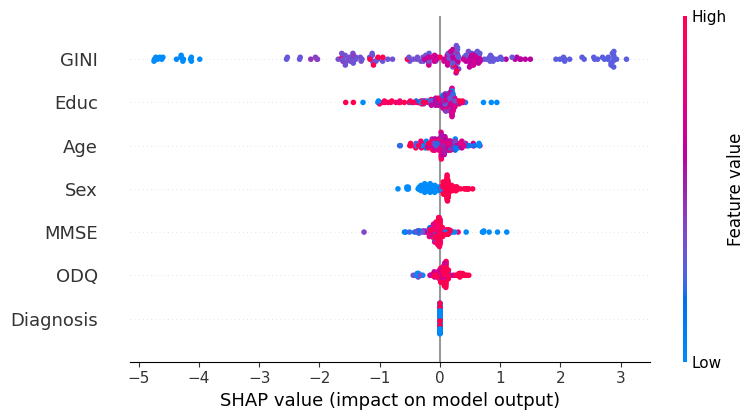

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -2.422156  0.149372 -0.630404 -0.208362 -0.345391        0.0  0.070866   
1 -2.552664 -0.021644  0.042506  0.131418 -0.200725        0.0  0.100304   
2 -2.330878  0.037656  0.168425  0.123651 -0.174847        0.0  0.100327   
3 -2.597411 -0.087122  0.013374  0.163118 -0.262376        0.0  0.091036   
4 -0.180602 -0.352535 -0.188910 -0.696632 -0.568101        0.0  0.055535   

   Predictions  Actual Labels  
0     0.032776              0  
1     0.075895              0  
2     0.111616              0  
3     0.064281              0  
4     0.126760              0  


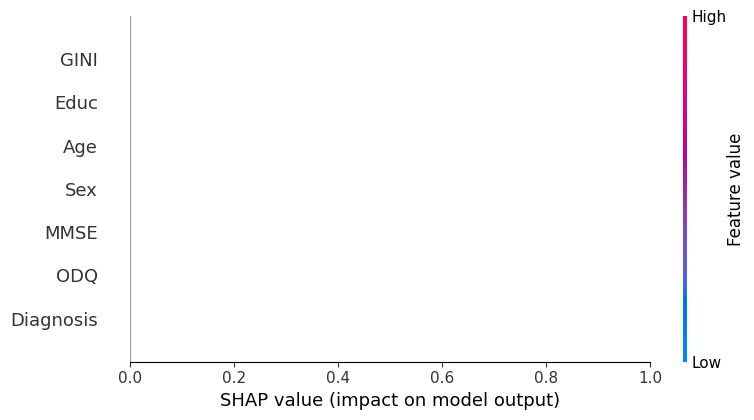

transitivity_cmimat_b AUC:  0.81 +-(  0.01 ) (958, 7)

salidaaa: -0.072 (0.998)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)      -0.072 (0.998)              None   
Age           -0.754 (0.000)                None              None   
Educ          -0.274 (0.000)                None              None   
Sex           -0.042 (0.099)                None              None   
MMSE           0.163 (0.000)                None              None   
Diagnosis     -0.059 (0.000)                None              None   
ODQ           -0.026 (1.000)                None              None   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                         None                     None   
Age                          None                     None   
Educ                         None                     None   
Sex                          None                     None   
MMSE                         None          

100%|██████████| 70/70 [00:06<00:00, 10.38it/s]


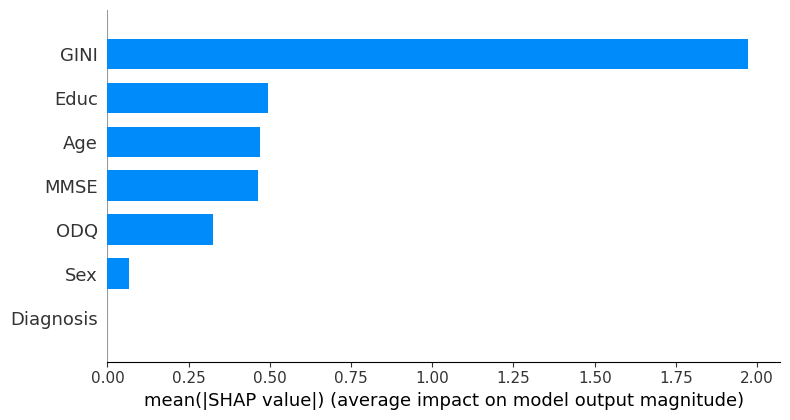

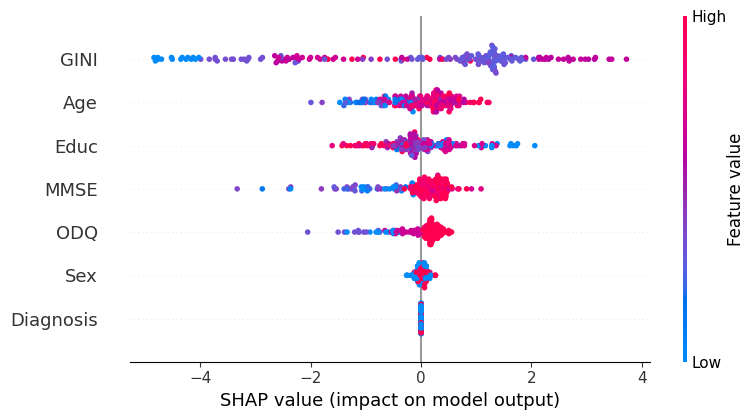

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -1.777594  0.108322  0.595471 -0.010807 -1.762848        0.0  0.003918   
1 -2.462743  0.137893 -0.181778  0.045865 -0.590702        0.0  0.190334   
2 -1.750049 -0.037761 -0.260340  0.011822 -1.808444        0.0  0.173561   
3 -1.924672 -0.040925 -0.273191 -0.094431 -0.812494        0.0  0.234328   
4 -0.062130  0.099960 -0.633082 -0.016963 -2.367803        0.0  0.132340   

   Predictions  Actual Labels  
0     0.054395              0  
1     0.053497              0  
2     0.024525              0  
3     0.051009              0  
4     0.054182              0  


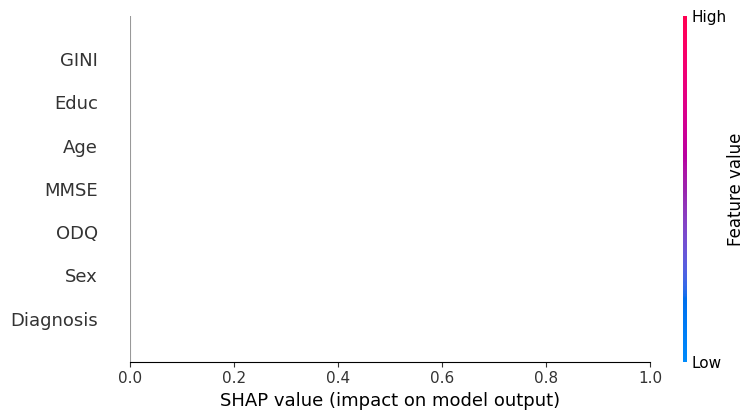

transitivity_omat_b AUC:  0.9 +-(  0.01 ) (958, 7)

salidaaa: -0.129 (0.001)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)      -0.072 (0.998)    -0.129 (0.001)   
Age           -0.754 (0.000)      -0.548 (0.000)              None   
Educ          -0.274 (0.000)      -0.465 (0.000)              None   
Sex           -0.042 (0.099)      -0.034 (0.873)              None   
MMSE           0.163 (0.000)      -0.060 (1.000)              None   
Diagnosis     -0.059 (0.000)      -0.002 (1.000)              None   
ODQ           -0.026 (1.000)       0.261 (0.000)              None   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                         None                     None   
Age                          None                     None   
Educ                         None                     None   
Sex                          None                     None   
MMSE                         None             

100%|██████████| 70/70 [00:07<00:00,  9.72it/s]


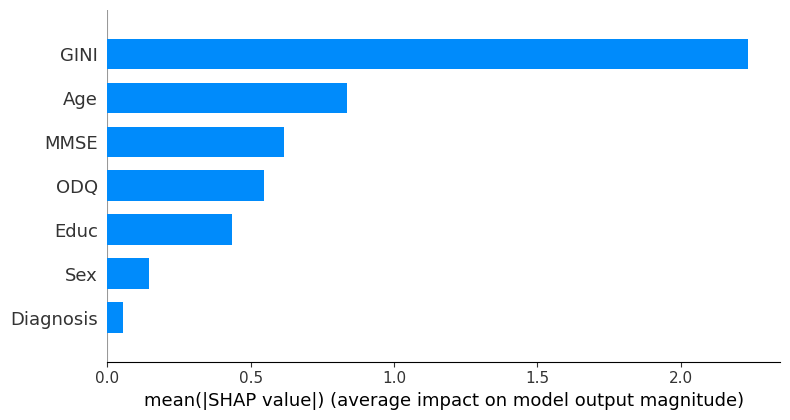

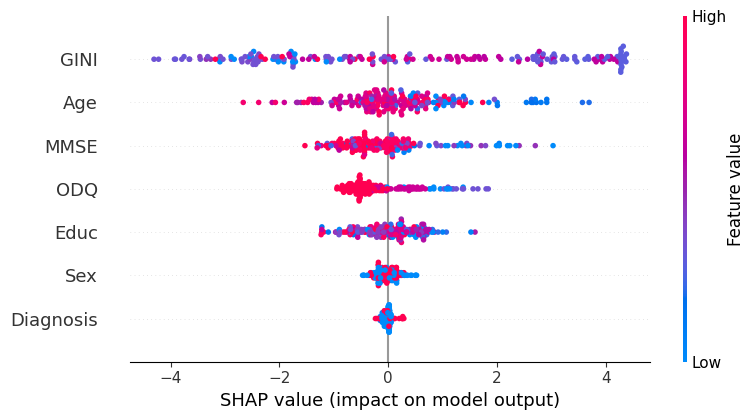

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -0.428749  0.335478  0.290300 -0.235175  1.537224  -0.103905 -0.565198   
1 -0.319711 -0.176792  0.183283  0.111793 -0.891778  -0.107111 -0.547872   
2  0.041092 -0.195985  0.999705  0.245638  1.208952  -0.149334 -0.538203   
3 -0.679081 -0.473598  0.109480  0.135318 -0.458468  -0.080147 -0.792110   
4  0.692432  0.509349  0.619841 -0.452755  0.750788  -0.171401 -0.556923   

   Predictions  Actual Labels  
0     0.695504              1  
1     0.147772              0  
2     0.833116              1  
3     0.095990              0  
4     0.800167              1  


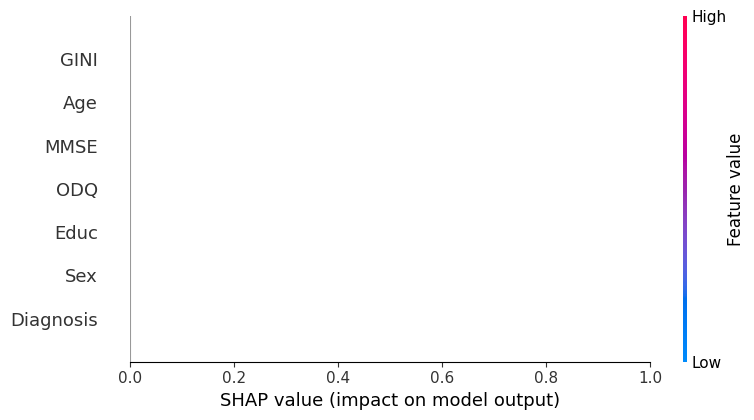

global_efficiency_mimat_b AUC:  0.87 +-(  0.01 ) (958, 7)

salidaaa: 0.223 (0.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)      -0.072 (0.998)    -0.129 (0.001)   
Age           -0.754 (0.000)      -0.548 (0.000)     0.034 (1.000)   
Educ          -0.274 (0.000)      -0.465 (0.000)    -0.586 (0.000)   
Sex           -0.042 (0.099)      -0.034 (0.873)    -0.069 (0.000)   
MMSE           0.163 (0.000)      -0.060 (1.000)     0.010 (1.000)   
Diagnosis     -0.059 (0.000)      -0.002 (1.000)    -0.061 (0.000)   
ODQ           -0.026 (1.000)       0.261 (0.000)     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)                     None   
Age                          None                     None   
Educ                         None                     None   
Sex                          None                     None   
MMSE                         None       

100%|██████████| 70/70 [00:05<00:00, 12.03it/s]


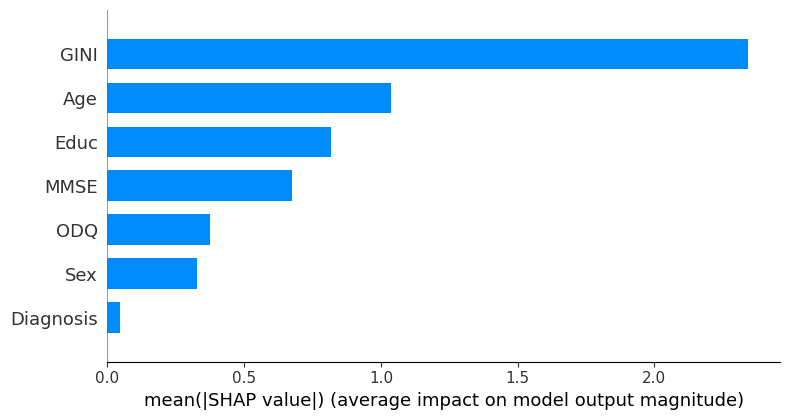

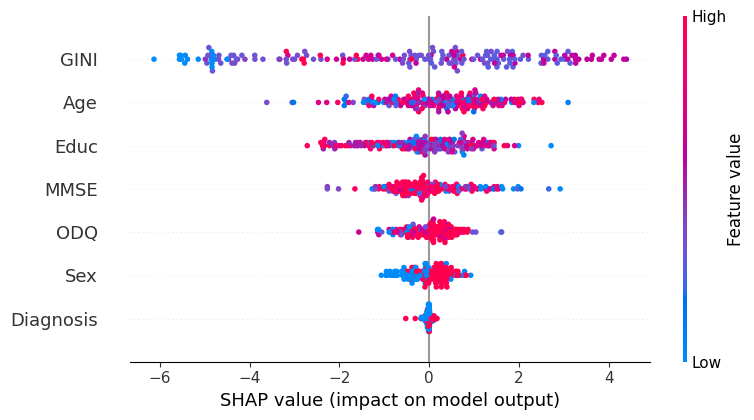

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -4.615526  1.138149 -0.300799 -0.651967 -2.079139  -0.253832 -0.100296   
1 -4.543500  1.680623 -0.342781  0.288078 -1.376174  -0.175252 -0.022278   
2 -4.644343 -0.249348 -0.466805  0.254886 -2.268596  -0.121730  0.232994   
3 -4.610649  0.636170 -1.905227  0.328204 -1.193096  -0.097179  0.037271   
4 -1.172419  0.718370 -2.222123 -0.477265 -1.269861  -0.310138 -0.029170   

   Predictions  Actual Labels  
0     0.000964              0  
1     0.010238              0  
2     0.000647              0  
3     0.001022              0  
4     0.007824              0  


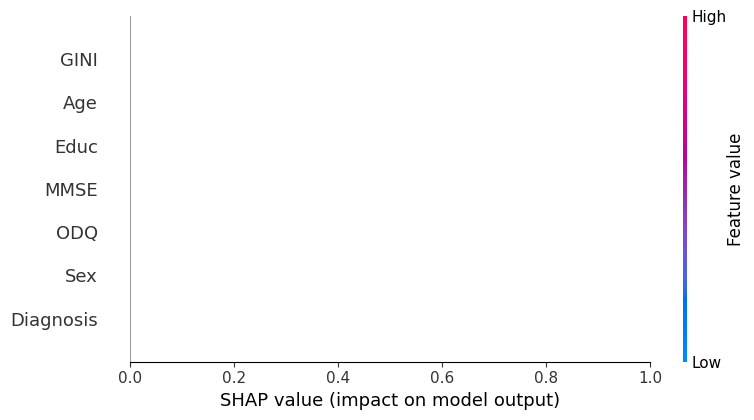

global_efficiency_cmimat_b AUC:  0.85 +-(  0.01 ) (958, 7)

salidaaa: -0.046 (1.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)      -0.072 (0.998)    -0.129 (0.001)   
Age           -0.754 (0.000)      -0.548 (0.000)     0.034 (1.000)   
Educ          -0.274 (0.000)      -0.465 (0.000)    -0.586 (0.000)   
Sex           -0.042 (0.099)      -0.034 (0.873)    -0.069 (0.000)   
MMSE           0.163 (0.000)      -0.060 (1.000)     0.010 (1.000)   
Diagnosis     -0.059 (0.000)      -0.002 (1.000)    -0.061 (0.000)   
ODQ           -0.026 (1.000)       0.261 (0.000)     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)           -0.046 (1.000)   
Age                -0.738 (0.000)                     None   
Educ               -0.329 (0.000)                     None   
Sex                -0.054 (0.000)                     None   
MMSE                0.150 (0.000)     

100%|██████████| 70/70 [00:06<00:00, 11.07it/s]


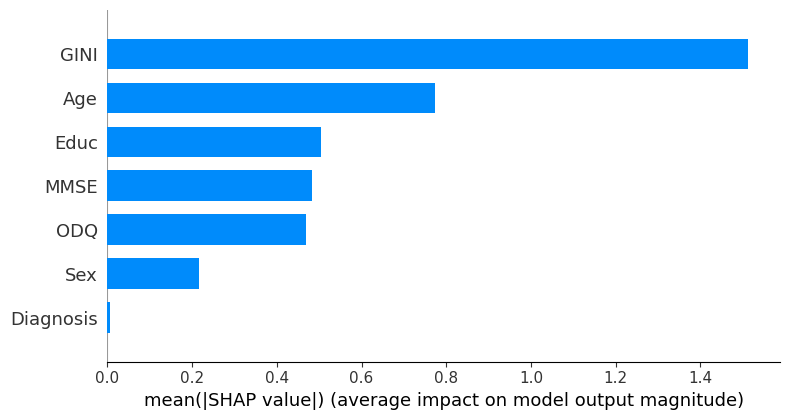

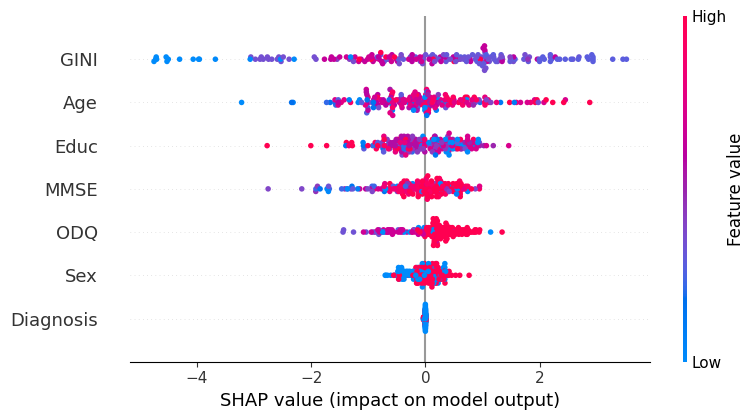

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -0.294396  0.174067  0.225445 -0.440658 -2.214442   0.011264  0.142760   
1 -0.447129  0.080197 -0.823740  0.328512 -1.952874   0.010289  0.194433   
2 -0.385075 -0.511205 -0.850812  0.371256 -1.887977  -0.002911  0.154775   
3  0.119961  1.100340  0.643919  0.258253 -0.852592  -0.010495  0.176973   
4 -0.173305 -0.840065  0.161178 -0.547208 -1.720417  -0.011463 -0.046736   

   Predictions  Actual Labels  
0     0.083426              0  
1     0.068431              0  
2     0.042587              0  
3     0.807777              1  
4     0.039973              0  


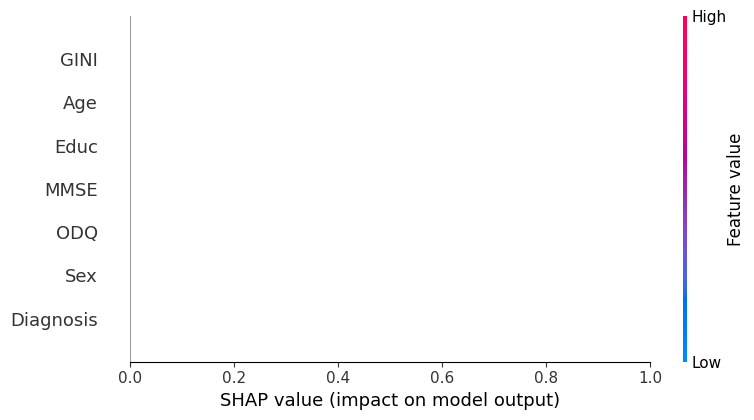

global_efficiency_omat_b AUC:  0.85 +-(  0.01 ) (958, 7)

salidaaa: -0.043 (1.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)      -0.072 (0.998)    -0.129 (0.001)   
Age           -0.754 (0.000)      -0.548 (0.000)     0.034 (1.000)   
Educ          -0.274 (0.000)      -0.465 (0.000)    -0.586 (0.000)   
Sex           -0.042 (0.099)      -0.034 (0.873)    -0.069 (0.000)   
MMSE           0.163 (0.000)      -0.060 (1.000)     0.010 (1.000)   
Diagnosis     -0.059 (0.000)      -0.002 (1.000)    -0.061 (0.000)   
ODQ           -0.026 (1.000)       0.261 (0.000)     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)           -0.046 (1.000)   
Age                -0.738 (0.000)           -0.278 (0.000)   
Educ               -0.329 (0.000)           -0.703 (0.000)   
Sex                -0.054 (0.000)           -0.030 (0.987)   
MMSE                0.150 (0.000)       

100%|██████████| 70/70 [00:08<00:00,  8.30it/s]


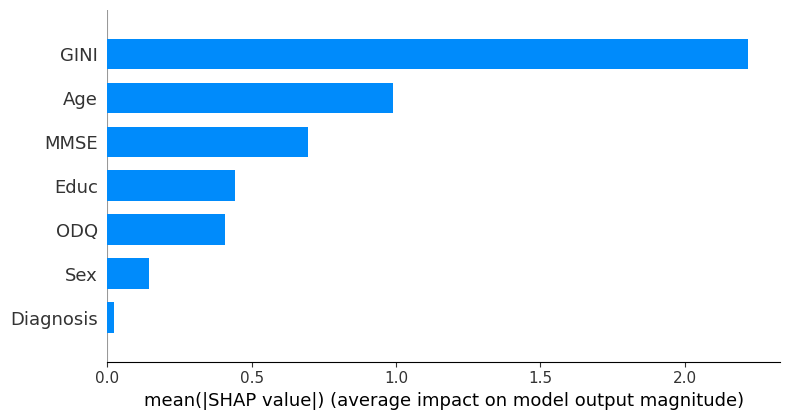

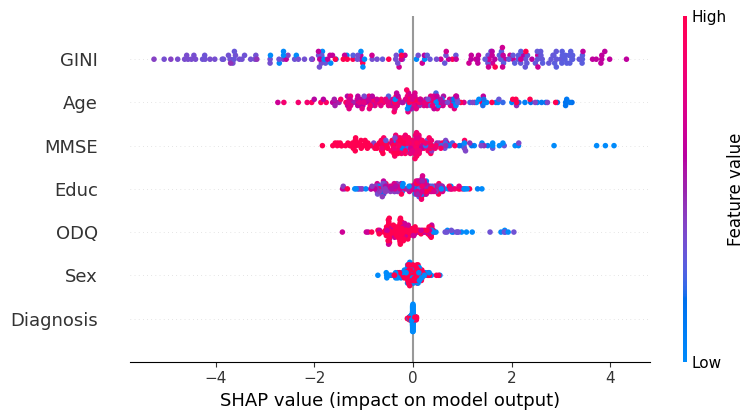

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  1.159285  0.833145  0.024297 -0.164942  0.244896   0.024796 -0.428956   
1  1.465248  0.581941  1.048152  0.117925  0.597825   0.002398 -0.435442   
2  1.518607 -0.368422  1.055611  0.309055  0.378828   0.023423 -0.491546   
3  1.418591  0.127178  0.288117  0.128924  0.956160   0.015257 -0.478750   
4  0.289300  0.314798  0.101796 -0.529585  1.242997   0.035461 -0.312152   

   Predictions  Actual Labels  
0     0.850413              1  
1     0.968427              1  
2     0.922075              1  
3     0.924198              1  
4     0.766372              1  


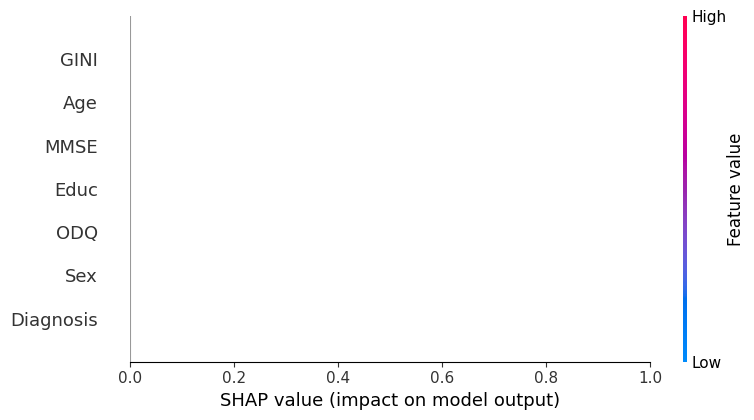

small_worldness_mimat_b AUC:  0.86 +-(  0.01 ) (958, 7)

salidaaa: 0.236 (0.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)      -0.072 (0.998)    -0.129 (0.001)   
Age           -0.754 (0.000)      -0.548 (0.000)     0.034 (1.000)   
Educ          -0.274 (0.000)      -0.465 (0.000)    -0.586 (0.000)   
Sex           -0.042 (0.099)      -0.034 (0.873)    -0.069 (0.000)   
MMSE           0.163 (0.000)      -0.060 (1.000)     0.010 (1.000)   
Diagnosis     -0.059 (0.000)      -0.002 (1.000)    -0.061 (0.000)   
ODQ           -0.026 (1.000)       0.261 (0.000)     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)           -0.046 (1.000)   
Age                -0.738 (0.000)           -0.278 (0.000)   
Educ               -0.329 (0.000)           -0.703 (0.000)   
Sex                -0.054 (0.000)           -0.030 (0.987)   
MMSE                0.150 (0.000)         

100%|██████████| 70/70 [00:06<00:00, 10.96it/s]


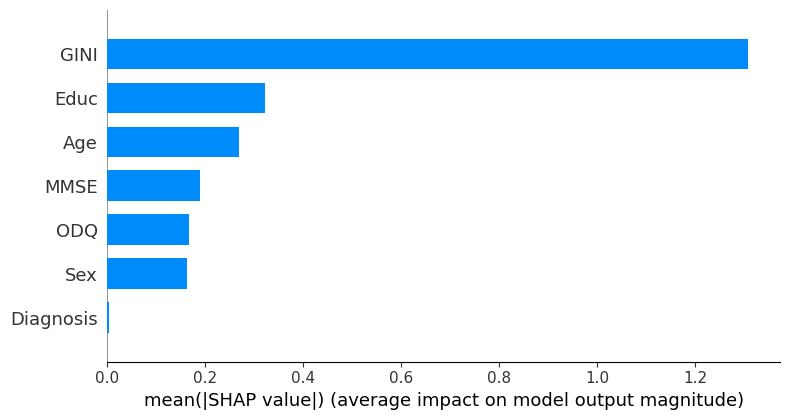

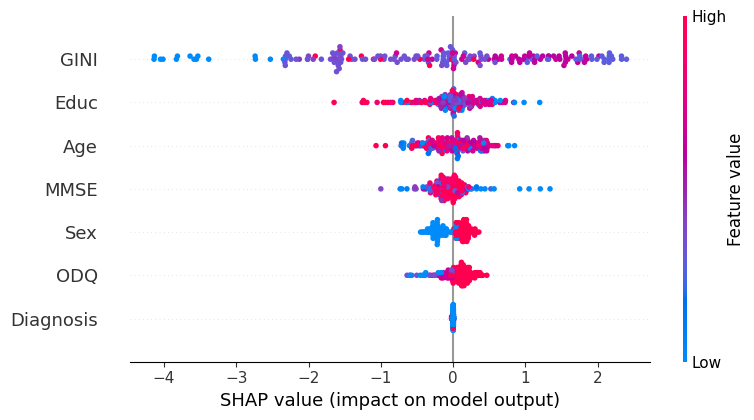

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -2.097196  0.090038 -0.227067 -0.259670 -0.586651  -0.017935  0.079678   
1 -2.376875  0.061527  0.402249  0.157802 -0.402625  -0.012284  0.100419   
2 -2.327599 -0.423348  0.349663  0.143967 -0.527932  -0.011691  0.140017   
3 -2.425006 -0.146544 -0.082036  0.171606 -0.409602  -0.013040  0.105772   
4 -0.645830 -0.564176 -0.162129 -0.427826 -0.710133  -0.018183  0.125940   

   Predictions  Actual Labels  
0     0.046658              0  
1     0.112235              0  
2     0.065666              0  
3     0.057477              0  
4     0.083122              0  


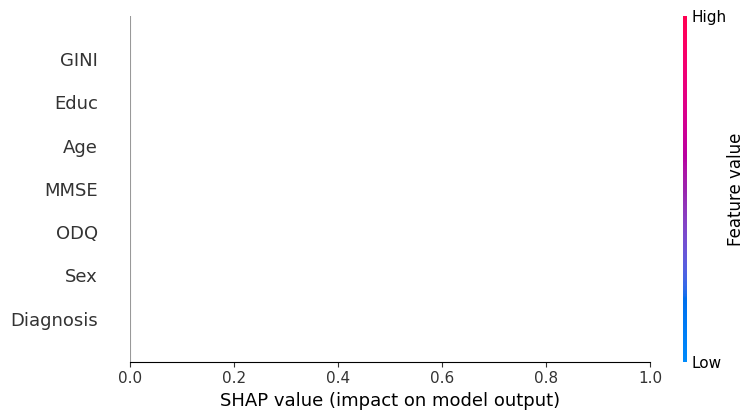

small_worldness_cmimat_b AUC:  0.79 +-(  0.01 ) (958, 7)

salidaaa: 0.045 (1.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)      -0.072 (0.998)    -0.129 (0.001)   
Age           -0.754 (0.000)      -0.548 (0.000)     0.034 (1.000)   
Educ          -0.274 (0.000)      -0.465 (0.000)    -0.586 (0.000)   
Sex           -0.042 (0.099)      -0.034 (0.873)    -0.069 (0.000)   
MMSE           0.163 (0.000)      -0.060 (1.000)     0.010 (1.000)   
Diagnosis     -0.059 (0.000)      -0.002 (1.000)    -0.061 (0.000)   
ODQ           -0.026 (1.000)       0.261 (0.000)     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)           -0.046 (1.000)   
Age                -0.738 (0.000)           -0.278 (0.000)   
Educ               -0.329 (0.000)           -0.703 (0.000)   
Sex                -0.054 (0.000)           -0.030 (0.987)   
MMSE                0.150 (0.000)        

100%|██████████| 70/70 [00:08<00:00,  8.04it/s]


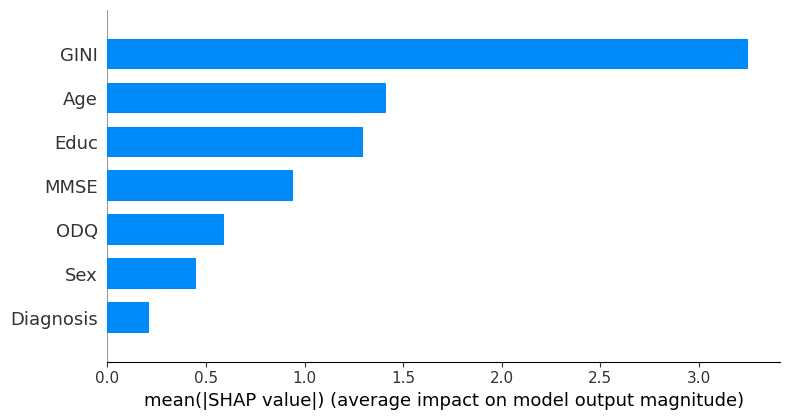

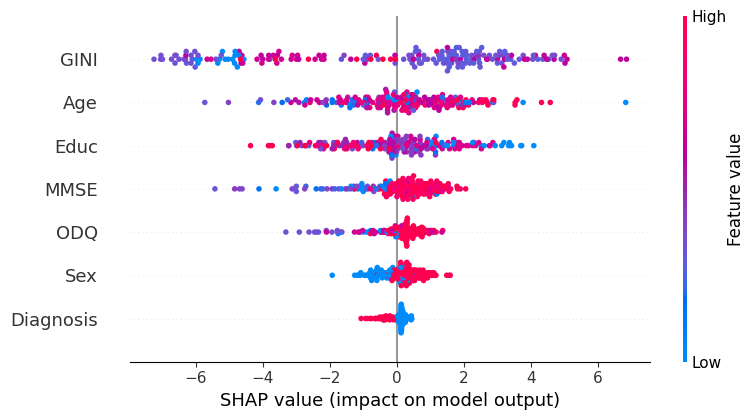

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -5.335968 -0.717421  1.848578  0.262891 -4.035878  -0.732930 -0.183968   
1 -5.682349 -0.597322 -0.719542  0.272977 -2.572809  -0.722682  0.277977   
2 -5.235196  0.248591 -0.661678  0.228504 -4.835599  -0.567764  0.291473   
3 -5.091513  0.440000 -1.818625  0.255185 -2.282230  -0.253893  0.246137   
4 -1.001933 -0.587230 -3.223562 -0.909986 -3.599516  -0.333787  0.421567   

   Predictions  Actual Labels  
0     0.000078              0  
1     0.000034              0  
2     0.000015              0  
3     0.000116              0  
4     0.000056              0  


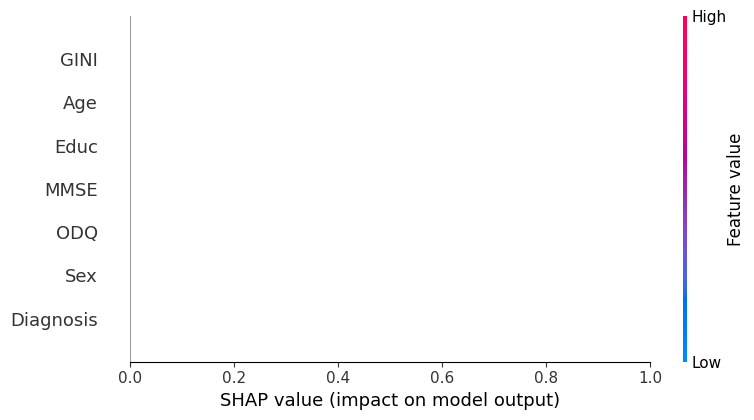

small_worldness_omat_b AUC:  0.9 +-(  0.01 ) (958, 7)

salidaaa: -0.195 (0.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)      -0.072 (0.998)    -0.129 (0.001)   
Age           -0.754 (0.000)      -0.548 (0.000)     0.034 (1.000)   
Educ          -0.274 (0.000)      -0.465 (0.000)    -0.586 (0.000)   
Sex           -0.042 (0.099)      -0.034 (0.873)    -0.069 (0.000)   
MMSE           0.163 (0.000)      -0.060 (1.000)     0.010 (1.000)   
Diagnosis     -0.059 (0.000)      -0.002 (1.000)    -0.061 (0.000)   
ODQ           -0.026 (1.000)       0.261 (0.000)     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)           -0.046 (1.000)   
Age                -0.738 (0.000)           -0.278 (0.000)   
Educ               -0.329 (0.000)           -0.703 (0.000)   
Sex                -0.054 (0.000)           -0.030 (0.987)   
MMSE                0.150 (0.000)          

In [ ]:
import pandas as pd


gini_age_results_preliminar = {}
gini_age_results_auc_preliminar = {}
gini_age_paragram = {}
outcome_directions = {}


all_predictors = ['GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']


df_metrics_slopes = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_correlation = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_pval = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_dir = pd.DataFrame(index=all_predictors, columns=outcomes_list)

df_metrics_averagersquared = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_t_values = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_f_values = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_f_p_values = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_cohen_f2_values = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_r_values = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_slopes_todo = pd.DataFrame(index=all_predictors, columns=outcomes_list)


for predictor in all_predictors:
    df_metrics_slopes.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_pval.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_dir.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_correlation.loc[predictor] = [None] * len(outcomes_list)



    df_metrics_averagersquared.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_average_t_values.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_average_f_values.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_average_f_p_values.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_average_cohen_f2_values.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_average_r_values.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_slopes_todo.loc[predictor] = [None] * len(outcomes_list)


for outcome in outcomes_list:
    print(f"Processing outcome: {outcome}")

    compl_df_mmse = compl_df_mod[[outcome, 'GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']]

    compl_df_mmse = compl_df_mmse.dropna()
    compl_df_mmse.reset_index(drop=True, inplace=True)


    median = compl_df_mmse[outcome].median()
    compl_df_mmse[outcome + '_b'] = (compl_df_mmse[outcome] > median).astype(int)


    y_compl_1A = compl_df_mmse[outcome + '_b']
    X_compl_1A = compl_df_mmse[['GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']]
    diagnosis = compl_df_mmse['Diagnosis']

    opt_XGB = SearchBestModel(X_compl_1A, y_compl_1A)
    params_ = dict(opt_XGB.best_params_)

    try:

        result_data = classifier_ROC(X_compl_1A, y_compl_1A, diagnosis, False, params_)

        gini_age_results_preliminar[outcome] = result_data['results_']
        gini_age_results_auc_preliminar[outcome] = result_data['results_'][2]
        gini_age_paragram[outcome] = params_


        combined_p = result_data['combined_p']
        slopes = result_data['slopes']
        directions = result_data['directions']
        intercepts = result_data['intercepts']
        correlation = result_data['correlations']


        averagersquared=result_data['rsquared']
        average_t_values=result_data['average_t_values']
        average_f_values=result_data['fvalues']
        average_f_p_values=result_data['fpvalues']
        average_cohen_f2_values=result_data['cohenf2values']
        average_r_values=result_data['average_r_values']

        slopes_todo = result_data['slopes_todo']



        for feature in X_compl_1A.columns:

            if feature in combined_p:
                average_slope = np.mean(slopes[feature])


                df_metrics_slopes.loc[feature, outcome] = f"{average_slope:.3f} ({combined_p[feature]:.3f})"


                # Actualiza df_metrics_pval
                df_metrics_pval.loc[feature, outcome] = combined_p[feature]

                # Actualiza df_metrics_dir
                df_metrics_dir.loc[feature, outcome] = directions[feature]


                df_metrics_correlation.loc[feature, outcome] = correlation[feature]

                df_metrics_slopes_todo.loc[feature, outcome] = slopes_todo[feature]

                df_metrics_averagersquared.loc[feature, outcome] = averagersquared[feature]
                df_metrics_average_t_values.loc[feature, outcome] = average_t_values[feature]
                df_metrics_average_f_values.loc[feature, outcome] = average_f_values[feature]
                df_metrics_average_f_p_values.loc[feature, outcome] = average_f_p_values[feature]
                df_metrics_average_cohen_f2_values.loc[feature, outcome] = average_cohen_f2_values[feature]
                df_metrics_average_r_values.loc[feature, outcome] = average_r_values[feature]



    except Exception as e:
        print(f'Error con {outcome + "_b"}: {e}')


features = []
estimates = []
t_values_list = []
p_values_list = []
r_squared_values = []
f2_values = []
f_values_list = []
f_p_values_list = []

# Guardar los DataFrames en un archivo de Excel
with pd.ExcelWriter(f'{base_path}resultados_completos_.xlsx') as writer:
    df_metrics_slopes.to_excel(writer, sheet_name='Slopes')
    df_metrics_pval.to_excel(writer, sheet_name='P-Values')
    df_metrics_dir.to_excel(writer, sheet_name='Directions')
    df_metrics_correlation.to_excel(writer, sheet_name='Correlation')
    df_metrics_averagersquared.to_excel(writer, sheet_name='R-Squared')
    df_metrics_average_t_values.to_excel(writer, sheet_name='T-Values')
    df_metrics_average_f_values.to_excel(writer, sheet_name='F-Values')
    df_metrics_average_f_p_values.to_excel(writer, sheet_name='F-P-Values')
    df_metrics_average_cohen_f2_values.to_excel(writer, sheet_name='Cohen-F2')
    df_metrics_average_r_values.to_excel(writer, sheet_name='R-values')
    df_metrics_slopes_todo.to_excel(writer, sheet_name='slopes_todo')


print("Resultados guardados en 'resultados_completos.xlsx'")

# Mostrar los DataFrames de métricas finales
print("\nDataFrame de métricas de pendientes:")
print(df_metrics_slopes)

print("\nDataFrame de p-values:")
print(df_metrics_pval)

print("\nDataFrame de direcciones:")
print(df_metrics_dir)

print("\nDataFrame de direcciones:")
print(df_metrics_correlation)

In [ ]:
top_10_keys_GINI_AGE_preliminar =heapq.nlargest(10, gini_age_results_auc_preliminar, key=gini_age_results_auc_preliminar.get)
top_10_keys_GINI_AGE_preliminar

['transitivity_omat',
 'small_worldness_omat',
 'global_efficiency_mimat',
 'transitivity_mimat',
 'small_worldness_mimat',
 'global_efficiency_cmimat',
 'global_efficiency_omat',
 'transitivity_cmimat',
 'small_worldness_cmimat']

Processing outcome: transitivity_omat
XGB
val. score: 0.8498938969527206
test score: 0.859375
best parameters: OrderedDict({'colsample_bytree': 1.0, 'eval_metric': 'error', 'learning_rate': 0.1, 'max_depth': 5, 'objective': 'binary:logistic', 'reg_alpha': 1.0, 'reg_lambda': 0, 'subsample': 1.0})
---------------------------------------------

         GINI      Age      Educ   Sex      MMSE  Diagnosis   ODQ
125  0.365066  0.71375  0.430769  0.05  0.616667          1  0.95
17   0.211420  0.74750  0.638462  0.05  0.683333          1  0.95
24   0.211420  0.64625  0.500000  0.95  0.683333          1  0.95
82   0.337722  0.77000  0.223077  0.95  0.616667          1  0.95
921  0.192822  0.75875  0.430769  0.95  0.850000          0  0.95
..        ...      ...       ...   ...       ...        ...   ...
776  0.209525  0.68000  0.223077  0.95  0.883333          0  0.65
818  0.188459  0.62375  0.223077  0.95  0.883333          0  0.65
362  0.337547  0.62375  0.430769  0.05  0.916667          0  0

100%|██████████| 70/70 [00:05<00:00, 12.32it/s]


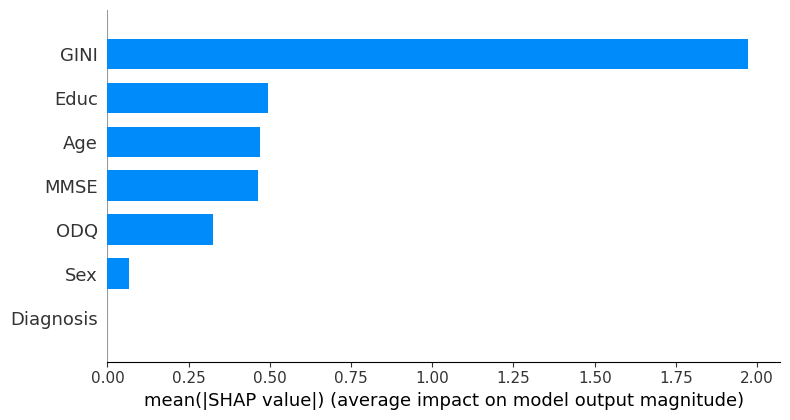

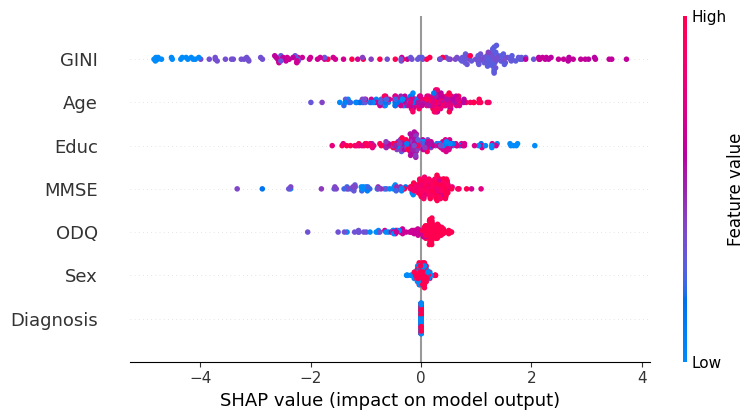

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -1.777594  0.108322  0.595471 -0.010807 -1.762848        0.0  0.003918   
1 -2.462743  0.137893 -0.181778  0.045865 -0.590702        0.0  0.190334   
2 -1.750049 -0.037761 -0.260340  0.011822 -1.808444        0.0  0.173561   
3 -1.924672 -0.040925 -0.273191 -0.094431 -0.812494        0.0  0.234328   
4 -0.062130  0.099960 -0.633082 -0.016963 -2.367803        0.0  0.132340   

   Predictions  Actual Labels  
0     0.054395              0  
1     0.053497              0  
2     0.024525              0  
3     0.051009              0  
4     0.054182              0  


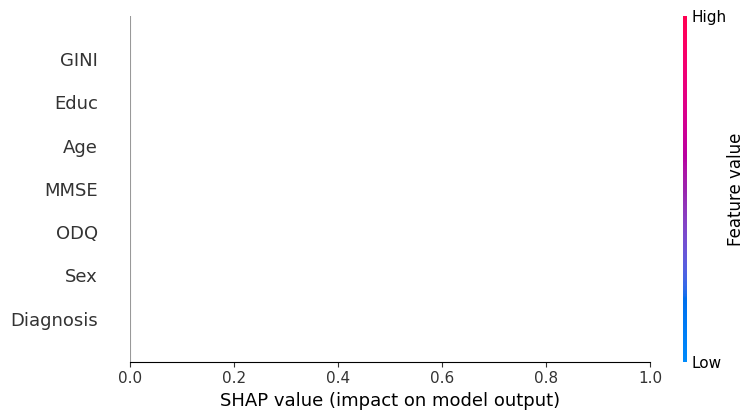

transitivity_omat_b AUC:  0.9 +-(  0.01 ) (958, 7)

salidaaa: -0.129 (0.001)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI                     NaN                 NaN    -0.129 (0.001)   
Age                      NaN                 NaN               NaN   
Educ                     NaN                 NaN               NaN   
Sex                      NaN                 NaN               NaN   
MMSE                     NaN                 NaN               NaN   
Diagnosis                NaN                 NaN               NaN   
ODQ                      NaN                 NaN               NaN   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                          NaN                      NaN   
Age                           NaN                      NaN   
Educ                          NaN                      NaN   
Sex                           NaN                      NaN   
MMSE                          NaN             

100%|██████████| 70/70 [00:04<00:00, 15.45it/s]


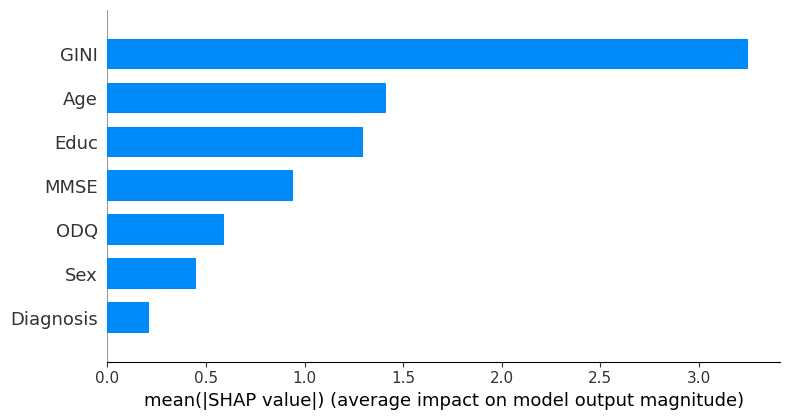

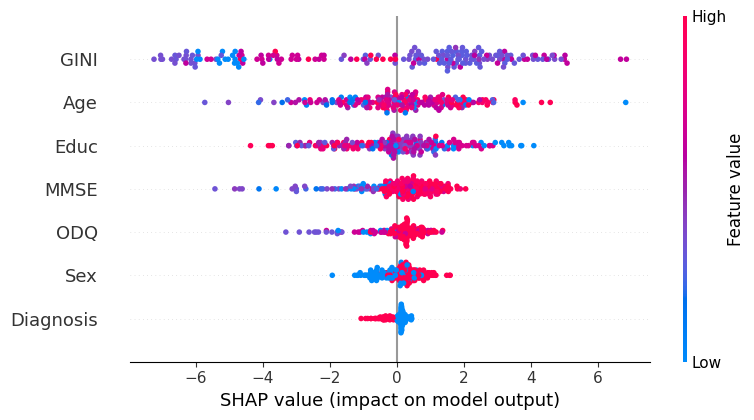

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -5.335968 -0.717421  1.848578  0.262891 -4.035878  -0.732930 -0.183968   
1 -5.682349 -0.597322 -0.719542  0.272977 -2.572809  -0.722682  0.277977   
2 -5.235196  0.248591 -0.661678  0.228504 -4.835599  -0.567764  0.291473   
3 -5.091513  0.440000 -1.818625  0.255185 -2.282230  -0.253893  0.246137   
4 -1.001933 -0.587230 -3.223562 -0.909986 -3.599516  -0.333787  0.421567   

   Predictions  Actual Labels  
0     0.000078              0  
1     0.000034              0  
2     0.000015              0  
3     0.000116              0  
4     0.000056              0  


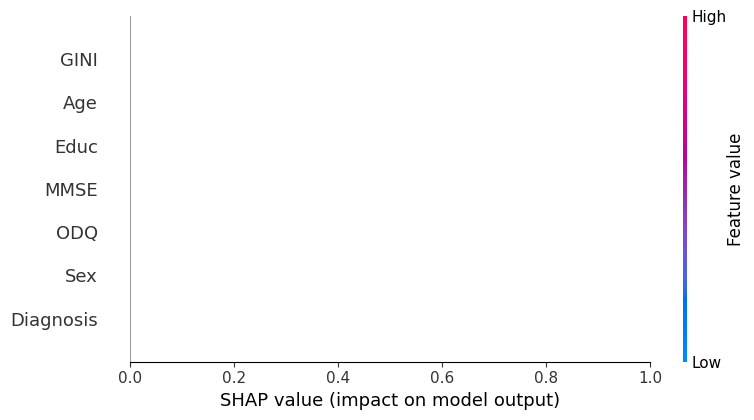

small_worldness_omat_b AUC:  0.9 +-(  0.01 ) (958, 7)

salidaaa: -0.195 (0.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI                     NaN                 NaN    -0.129 (0.001)   
Age                      NaN                 NaN     0.034 (1.000)   
Educ                     NaN                 NaN    -0.586 (0.000)   
Sex                      NaN                 NaN    -0.069 (0.000)   
MMSE                     NaN                 NaN     0.010 (1.000)   
Diagnosis                NaN                 NaN    -0.061 (0.000)   
ODQ                      NaN                 NaN     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                          NaN                      NaN   
Age                           NaN                      NaN   
Educ                          NaN                      NaN   
Sex                           NaN                      NaN   
MMSE                          NaN          

100%|██████████| 70/70 [00:07<00:00,  9.97it/s]


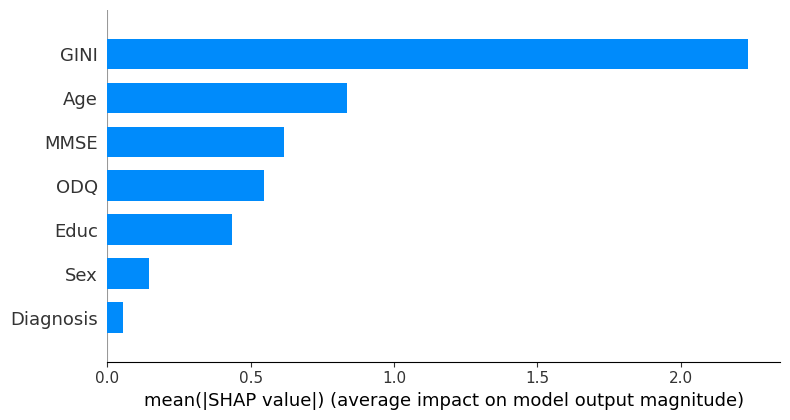

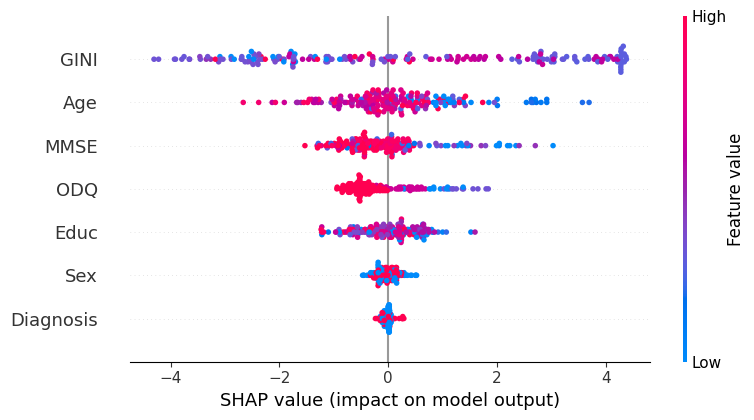

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -0.428749  0.335478  0.290300 -0.235175  1.537224  -0.103905 -0.565198   
1 -0.319711 -0.176792  0.183283  0.111793 -0.891778  -0.107111 -0.547872   
2  0.041092 -0.195985  0.999705  0.245638  1.208952  -0.149334 -0.538203   
3 -0.679081 -0.473598  0.109480  0.135318 -0.458468  -0.080147 -0.792110   
4  0.692432  0.509349  0.619841 -0.452755  0.750788  -0.171401 -0.556923   

   Predictions  Actual Labels  
0     0.695504              1  
1     0.147772              0  
2     0.833116              1  
3     0.095990              0  
4     0.800167              1  


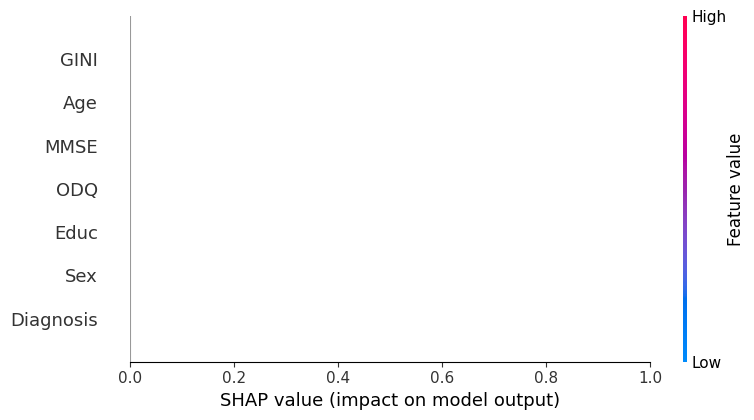

global_efficiency_mimat_b AUC:  0.87 +-(  0.01 ) (958, 7)

salidaaa: 0.223 (0.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI                     NaN                 NaN    -0.129 (0.001)   
Age                      NaN                 NaN     0.034 (1.000)   
Educ                     NaN                 NaN    -0.586 (0.000)   
Sex                      NaN                 NaN    -0.069 (0.000)   
MMSE                     NaN                 NaN     0.010 (1.000)   
Diagnosis                NaN                 NaN    -0.061 (0.000)   
ODQ                      NaN                 NaN     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)                      NaN   
Age                           NaN                      NaN   
Educ                          NaN                      NaN   
Sex                           NaN                      NaN   
MMSE                          NaN       

100%|██████████| 70/70 [00:05<00:00, 13.88it/s]


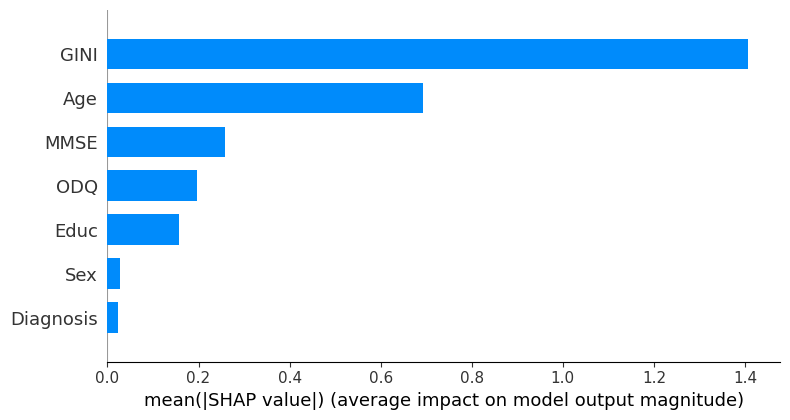

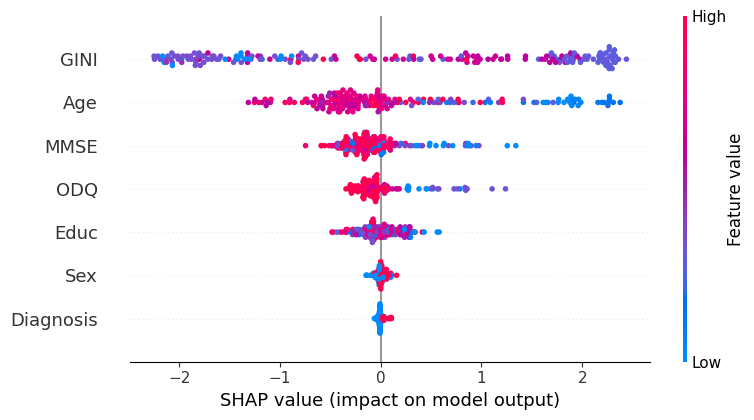

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -0.130774 -0.204180 -0.003846 -0.016407  0.228385   0.014075 -0.206677   
1 -0.165847 -0.393380  0.004888  0.010186 -0.313574   0.011927 -0.236363   
2 -0.148141 -0.111778  0.289961  0.081945  0.287253   0.018547 -0.213189   
3 -0.213463 -0.380075 -0.104597  0.010296 -0.276620   0.018987 -0.289130   
4  0.618867 -0.054756  0.114001 -0.145625  0.368769   0.020091 -0.065494   

   Predictions  Actual Labels  
0     0.419610              1  
1     0.252162              0  
2     0.549747              1  
3     0.224514              0  
4     0.700757              1  


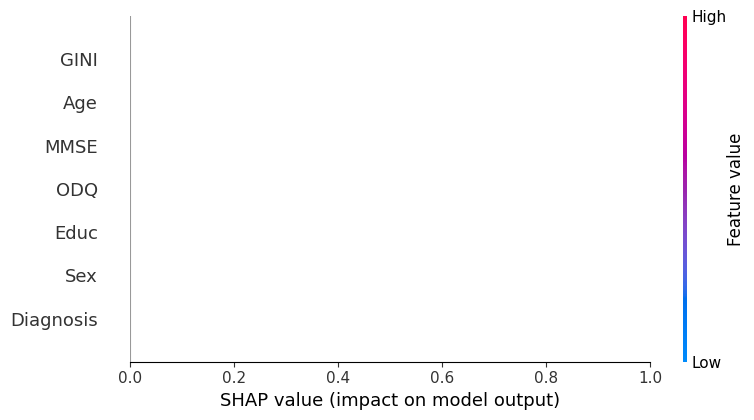

transitivity_mimat_b AUC:  0.86 +-(  0.01 ) (958, 7)

salidaaa: 0.227 (0.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)                 NaN    -0.129 (0.001)   
Age                      NaN                 NaN     0.034 (1.000)   
Educ                     NaN                 NaN    -0.586 (0.000)   
Sex                      NaN                 NaN    -0.069 (0.000)   
MMSE                     NaN                 NaN     0.010 (1.000)   
Diagnosis                NaN                 NaN    -0.061 (0.000)   
ODQ                      NaN                 NaN     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)                      NaN   
Age                -0.738 (0.000)                      NaN   
Educ               -0.329 (0.000)                      NaN   
Sex                -0.054 (0.000)                      NaN   
MMSE                0.150 (0.000)            

100%|██████████| 70/70 [00:05<00:00, 12.46it/s]


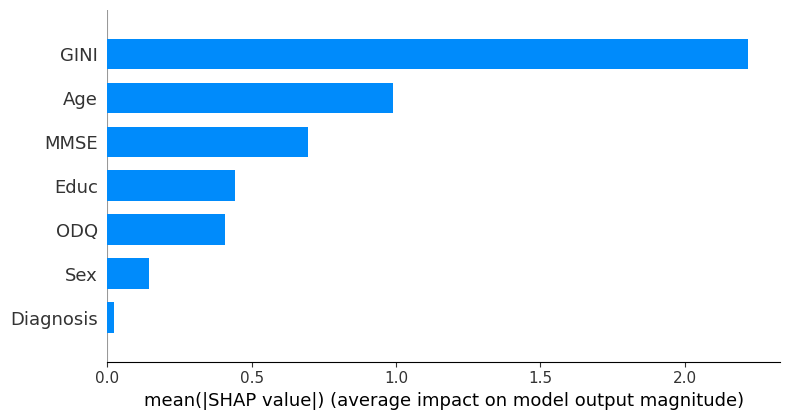

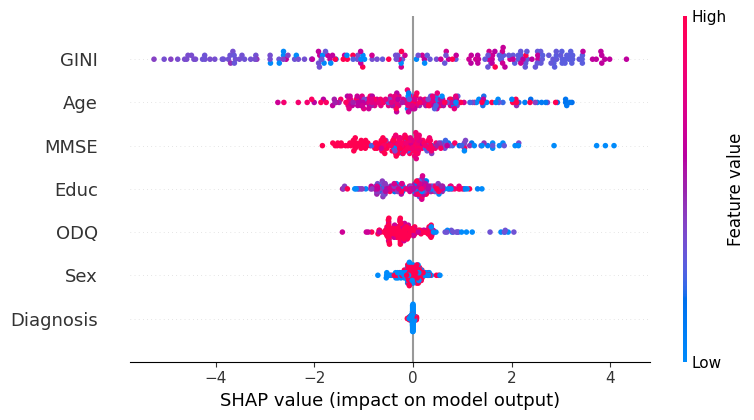

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  1.159285  0.833145  0.024297 -0.164942  0.244896   0.024796 -0.428956   
1  1.465248  0.581941  1.048152  0.117925  0.597825   0.002398 -0.435442   
2  1.518607 -0.368422  1.055611  0.309055  0.378828   0.023423 -0.491546   
3  1.418591  0.127178  0.288117  0.128924  0.956160   0.015257 -0.478750   
4  0.289300  0.314798  0.101796 -0.529585  1.242997   0.035461 -0.312152   

   Predictions  Actual Labels  
0     0.850413              1  
1     0.968427              1  
2     0.922075              1  
3     0.924198              1  
4     0.766372              1  


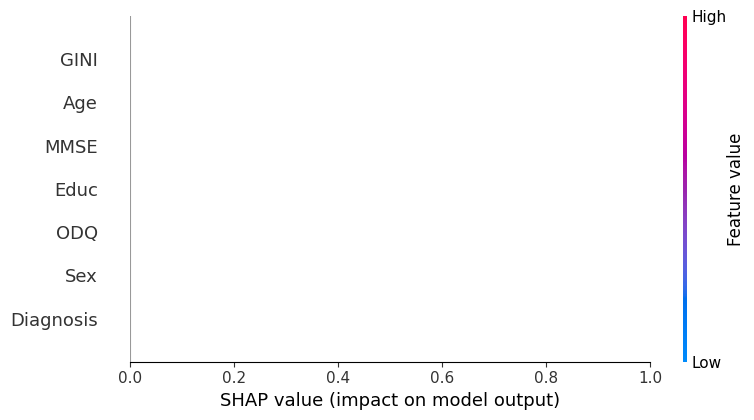

small_worldness_mimat_b AUC:  0.86 +-(  0.01 ) (958, 7)

salidaaa: 0.236 (0.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)                 NaN    -0.129 (0.001)   
Age           -0.754 (0.000)                 NaN     0.034 (1.000)   
Educ          -0.274 (0.000)                 NaN    -0.586 (0.000)   
Sex           -0.042 (0.099)                 NaN    -0.069 (0.000)   
MMSE           0.163 (0.000)                 NaN     0.010 (1.000)   
Diagnosis     -0.059 (0.000)                 NaN    -0.061 (0.000)   
ODQ           -0.026 (1.000)                 NaN     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)                      NaN   
Age                -0.738 (0.000)                      NaN   
Educ               -0.329 (0.000)                      NaN   
Sex                -0.054 (0.000)                      NaN   
MMSE                0.150 (0.000)         

100%|██████████| 70/70 [00:07<00:00,  8.82it/s]


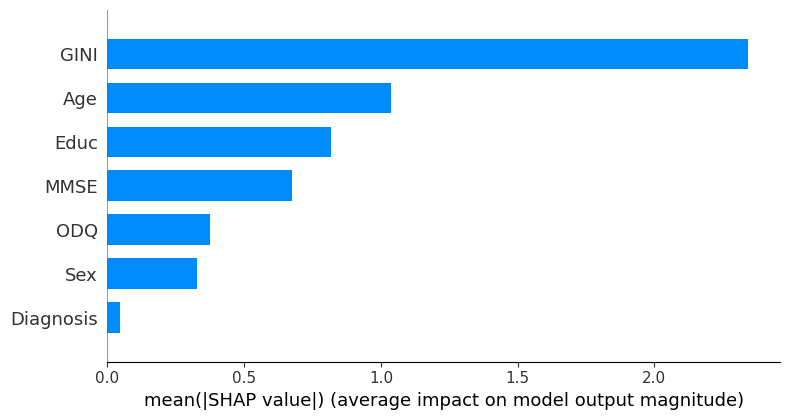

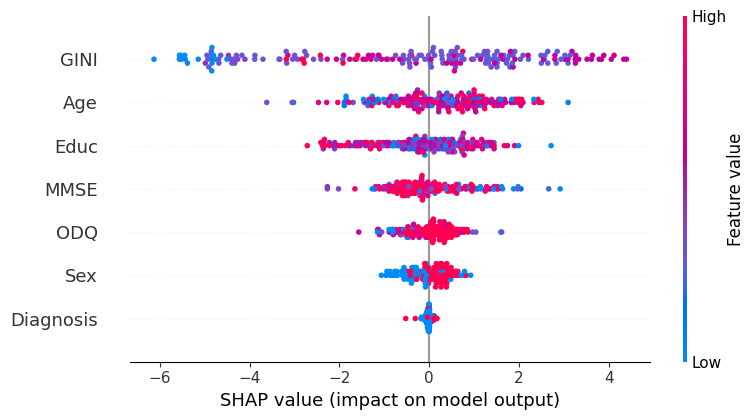

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -4.615526  1.138149 -0.300799 -0.651967 -2.079139  -0.253832 -0.100296   
1 -4.543500  1.680623 -0.342781  0.288078 -1.376174  -0.175252 -0.022278   
2 -4.644343 -0.249348 -0.466805  0.254886 -2.268596  -0.121730  0.232994   
3 -4.610649  0.636170 -1.905227  0.328204 -1.193096  -0.097179  0.037271   
4 -1.172419  0.718370 -2.222123 -0.477265 -1.269861  -0.310138 -0.029170   

   Predictions  Actual Labels  
0     0.000964              0  
1     0.010238              0  
2     0.000647              0  
3     0.001022              0  
4     0.007824              0  


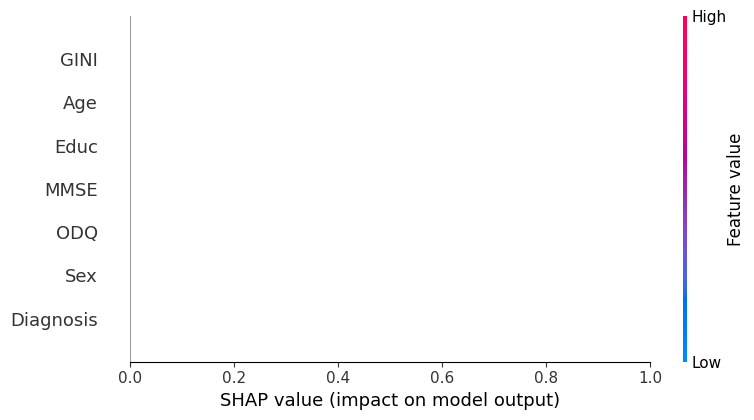

global_efficiency_cmimat_b AUC:  0.85 +-(  0.01 ) (958, 7)

salidaaa: -0.046 (1.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)                 NaN    -0.129 (0.001)   
Age           -0.754 (0.000)                 NaN     0.034 (1.000)   
Educ          -0.274 (0.000)                 NaN    -0.586 (0.000)   
Sex           -0.042 (0.099)                 NaN    -0.069 (0.000)   
MMSE           0.163 (0.000)                 NaN     0.010 (1.000)   
Diagnosis     -0.059 (0.000)                 NaN    -0.061 (0.000)   
ODQ           -0.026 (1.000)                 NaN     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)           -0.046 (1.000)   
Age                -0.738 (0.000)                      NaN   
Educ               -0.329 (0.000)                      NaN   
Sex                -0.054 (0.000)                      NaN   
MMSE                0.150 (0.000)     

100%|██████████| 70/70 [00:10<00:00,  6.97it/s]


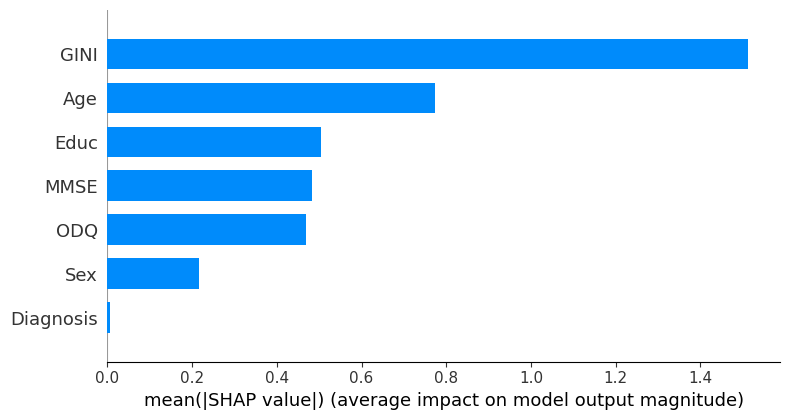

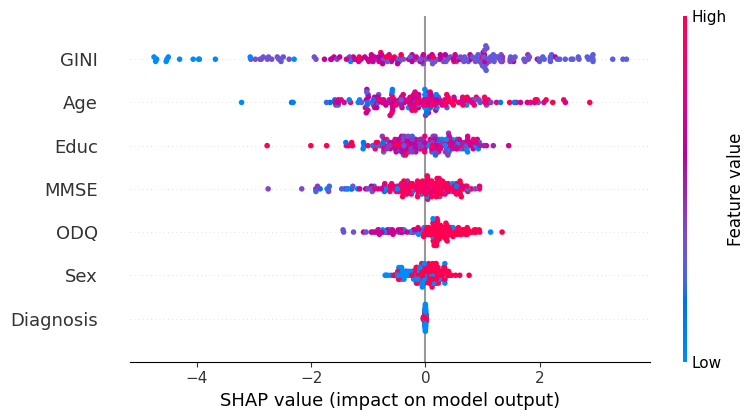

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -0.294396  0.174067  0.225445 -0.440658 -2.214442   0.011264  0.142760   
1 -0.447129  0.080197 -0.823740  0.328512 -1.952874   0.010289  0.194433   
2 -0.385075 -0.511205 -0.850812  0.371256 -1.887977  -0.002911  0.154775   
3  0.119961  1.100340  0.643919  0.258253 -0.852592  -0.010495  0.176973   
4 -0.173305 -0.840065  0.161178 -0.547208 -1.720417  -0.011463 -0.046736   

   Predictions  Actual Labels  
0     0.083426              0  
1     0.068431              0  
2     0.042587              0  
3     0.807777              1  
4     0.039973              0  


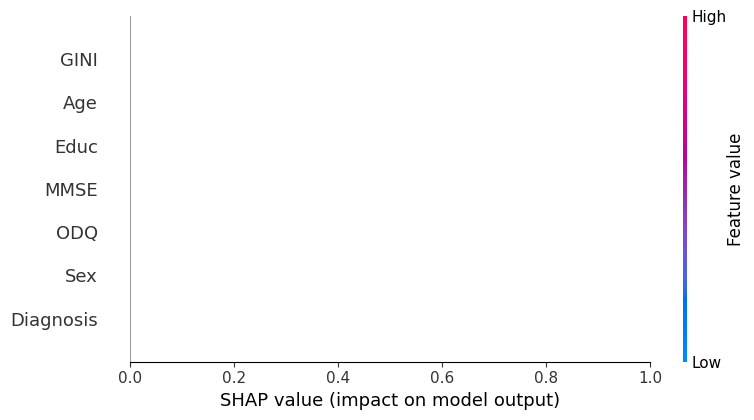

global_efficiency_omat_b AUC:  0.85 +-(  0.01 ) (958, 7)

salidaaa: -0.043 (1.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)                 NaN    -0.129 (0.001)   
Age           -0.754 (0.000)                 NaN     0.034 (1.000)   
Educ          -0.274 (0.000)                 NaN    -0.586 (0.000)   
Sex           -0.042 (0.099)                 NaN    -0.069 (0.000)   
MMSE           0.163 (0.000)                 NaN     0.010 (1.000)   
Diagnosis     -0.059 (0.000)                 NaN    -0.061 (0.000)   
ODQ           -0.026 (1.000)                 NaN     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)           -0.046 (1.000)   
Age                -0.738 (0.000)           -0.278 (0.000)   
Educ               -0.329 (0.000)           -0.703 (0.000)   
Sex                -0.054 (0.000)           -0.030 (0.987)   
MMSE                0.150 (0.000)       

100%|██████████| 70/70 [00:21<00:00,  3.22it/s]


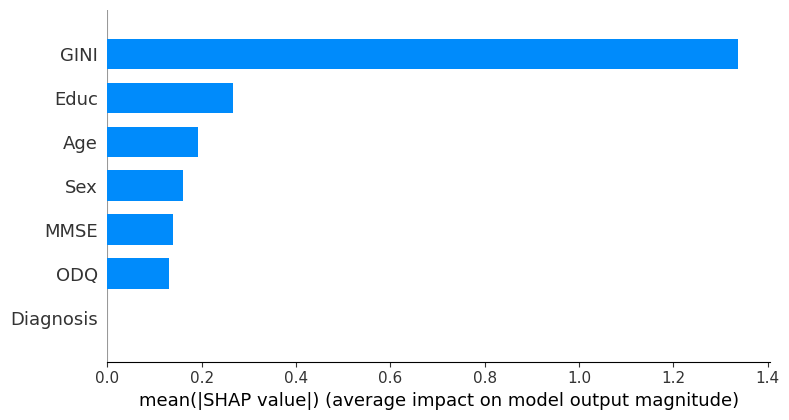

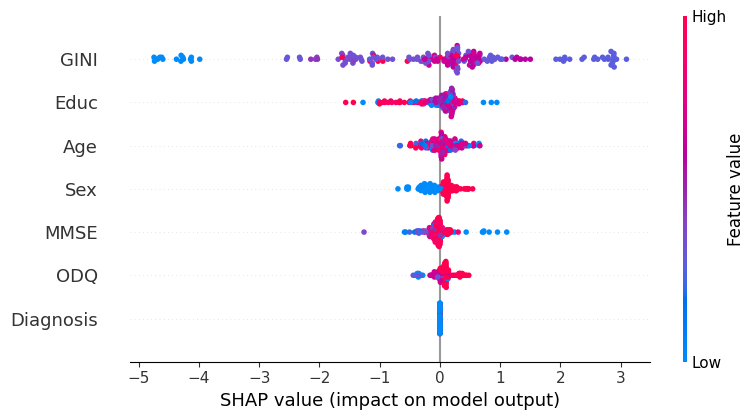

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -2.422156  0.149372 -0.630404 -0.208362 -0.345391        0.0  0.070866   
1 -2.552664 -0.021644  0.042506  0.131418 -0.200725        0.0  0.100304   
2 -2.330878  0.037656  0.168425  0.123651 -0.174847        0.0  0.100327   
3 -2.597411 -0.087122  0.013374  0.163118 -0.262376        0.0  0.091036   
4 -0.180602 -0.352535 -0.188910 -0.696632 -0.568101        0.0  0.055535   

   Predictions  Actual Labels  
0     0.032776              0  
1     0.075895              0  
2     0.111616              0  
3     0.064281              0  
4     0.126760              0  


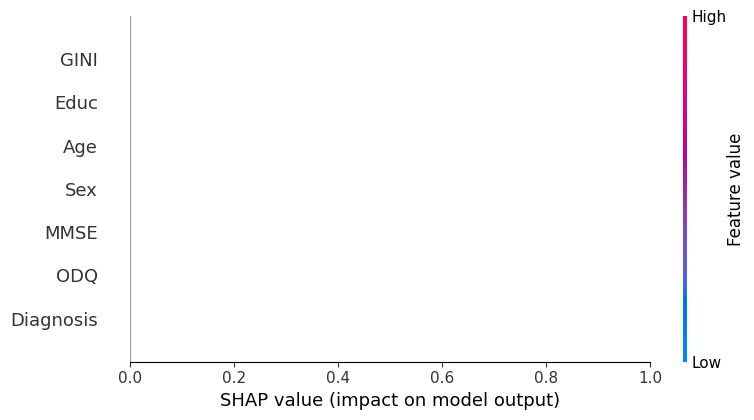

transitivity_cmimat_b AUC:  0.81 +-(  0.01 ) (958, 7)

salidaaa: -0.072 (0.998)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)      -0.072 (0.998)    -0.129 (0.001)   
Age           -0.754 (0.000)                 NaN     0.034 (1.000)   
Educ          -0.274 (0.000)                 NaN    -0.586 (0.000)   
Sex           -0.042 (0.099)                 NaN    -0.069 (0.000)   
MMSE           0.163 (0.000)                 NaN     0.010 (1.000)   
Diagnosis     -0.059 (0.000)                 NaN    -0.061 (0.000)   
ODQ           -0.026 (1.000)                 NaN     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)           -0.046 (1.000)   
Age                -0.738 (0.000)           -0.278 (0.000)   
Educ               -0.329 (0.000)           -0.703 (0.000)   
Sex                -0.054 (0.000)           -0.030 (0.987)   
MMSE                0.150 (0.000)          

100%|██████████| 70/70 [00:10<00:00,  6.81it/s]


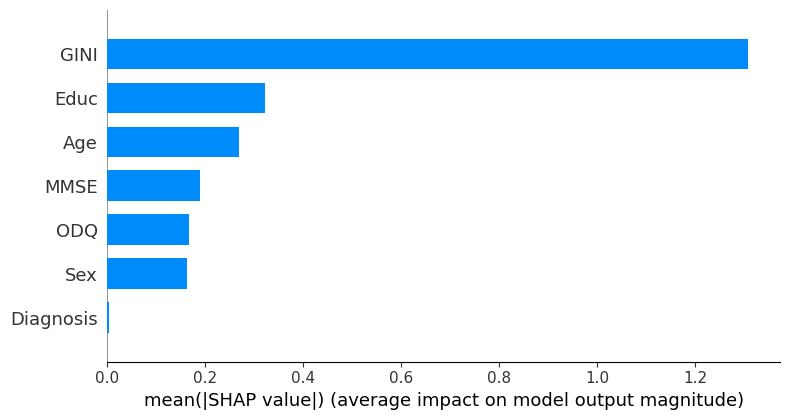

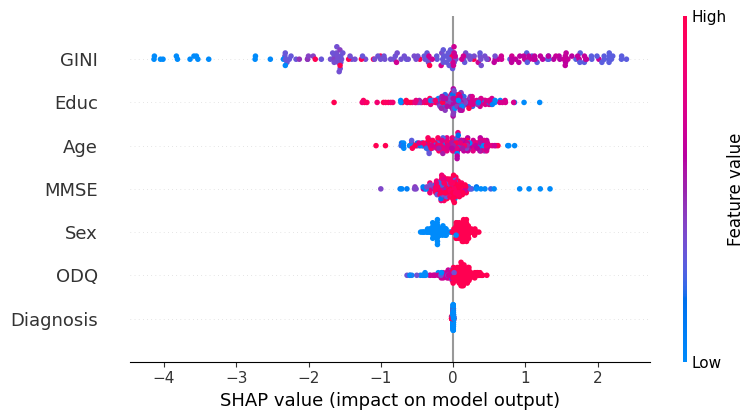

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0 -2.097196  0.090038 -0.227067 -0.259670 -0.586651  -0.017935  0.079678   
1 -2.376875  0.061527  0.402249  0.157802 -0.402625  -0.012284  0.100419   
2 -2.327599 -0.423348  0.349663  0.143967 -0.527932  -0.011691  0.140017   
3 -2.425006 -0.146544 -0.082036  0.171606 -0.409602  -0.013040  0.105772   
4 -0.645830 -0.564176 -0.162129 -0.427826 -0.710133  -0.018183  0.125940   

   Predictions  Actual Labels  
0     0.046658              0  
1     0.112235              0  
2     0.065666              0  
3     0.057477              0  
4     0.083122              0  


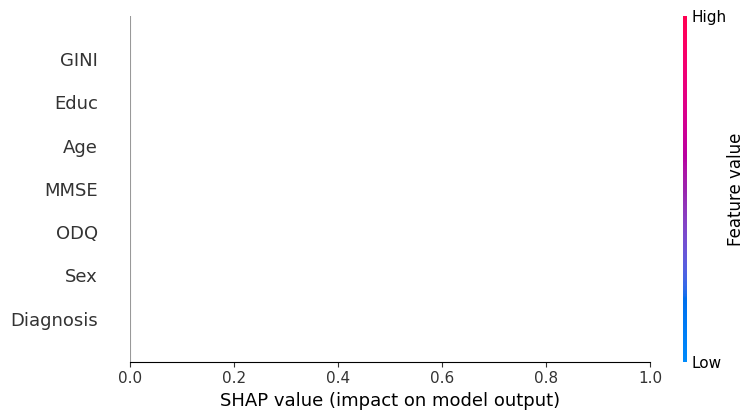

small_worldness_cmimat_b AUC:  0.79 +-(  0.01 ) (958, 7)

salidaaa: 0.045 (1.000)
yupii           transitivity_mimat transitivity_cmimat transitivity_omat  \
GINI           0.227 (0.000)      -0.072 (0.998)    -0.129 (0.001)   
Age           -0.754 (0.000)      -0.548 (0.000)     0.034 (1.000)   
Educ          -0.274 (0.000)      -0.465 (0.000)    -0.586 (0.000)   
Sex           -0.042 (0.099)      -0.034 (0.873)    -0.069 (0.000)   
MMSE           0.163 (0.000)      -0.060 (1.000)     0.010 (1.000)   
Diagnosis     -0.059 (0.000)      -0.002 (1.000)    -0.061 (0.000)   
ODQ           -0.026 (1.000)       0.261 (0.000)     0.277 (0.000)   

          global_efficiency_mimat global_efficiency_cmimat  \
GINI                0.223 (0.000)           -0.046 (1.000)   
Age                -0.738 (0.000)           -0.278 (0.000)   
Educ               -0.329 (0.000)           -0.703 (0.000)   
Sex                -0.054 (0.000)           -0.030 (0.987)   
MMSE                0.150 (0.000)        

'print("\nDataFrame de métricas de pendientes:")\nprint(df_metrics_slopes)\n\nprint("\nDataFrame de p-values:")\nprint(df_metrics_pval)\n\nprint("\nDataFrame de direcciones:")\nprint(df_metrics_dir)'

In [ ]:
import pandas as pd

# Definir los diccionarios para almacenar los resultados
gini_age_results = {}
gini_age_results_auc= {}
gini_age_paragram = {}
outcome_directions = {}


all_predictors = ['GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']


df_metrics_slopes_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_pval_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_dir_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)

df_metrics_correlation_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)

df_metrics_averagersquared_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_t_values_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_f_values_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_f_p_values_=pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_cohen_f2_values_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_r_values_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_slopes_todo_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)


for predictor in all_predictors:
    if predictor not in df_metrics_slopes_.index:
        df_metrics_slopes_.loc[predictor] = [None] * df_metrics_slopes_.shape[1]
    else:
        df_metrics_slopes_.loc[predictor] = df_metrics_slopes_.loc[predictor]


for outcome in top_10_keys_GINI_AGE_preliminar:
    print(f"Processing outcome: {outcome}")

    compl_df_mmse = compl_df_mod[[outcome, 'GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']]


    compl_df_mmse = compl_df_mmse.dropna()
    compl_df_mmse.reset_index(drop=True, inplace=True)


    median = compl_df_mmse[outcome].median()
    compl_df_mmse[outcome + '_b'] = (compl_df_mmse[outcome] > median).astype(int)



    y_compl_1A = compl_df_mmse[outcome + '_b']
    X_compl_1A = compl_df_mmse[['GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']]
    diagnosis = compl_df_mmse['Diagnosis']


    opt_XGB = SearchBestModel(X_compl_1A, y_compl_1A)
    params_ = dict(opt_XGB.best_params_)

    try:



        result_data = classifier_ROC(X_compl_1A, y_compl_1A, diagnosis, False, params_)

        gini_age_results[outcome] = result_data['results_']
        gini_age_results_auc[outcome] = result_data['results_'][2]
        gini_age_paragram[outcome] = params_



        combined_p = result_data['combined_p']
        slopes = result_data['slopes']
        directions = result_data['directions']
        intercepts = result_data['intercepts']
        correlation = result_data['correlations']


        averagersquared=result_data['rsquared']
        average_t_values=result_data['average_t_values']
        average_f_values=result_data['fvalues']
        average_f_p_values=result_data['fpvalues']
        average_cohen_f2_values=result_data['cohenf2values']
        average_r_values=result_data['average_r_values']


        for feature in X_compl_1A.columns:

            if feature in combined_p:
                average_slope = np.mean(slopes[feature])
                # Actualiza df_metrics_slopes
                df_metrics_slopes_.loc[feature, outcome] = f"{average_slope:.3f} ({combined_p[feature]:.3f})"
                print("\nsalidaaa:", df_metrics_slopes_.loc[feature, outcome])

                # Actualiza df_metrics_pval
                df_metrics_pval_.loc[feature, outcome] = combined_p[feature]

                # Actualiza df_metrics_dir
                df_metrics_dir_.loc[feature, outcome] = directions[feature]

                df_metrics_correlation_.loc[feature, outcome] = correlation[feature]


                df_metrics_averagersquared_.loc[feature, outcome] = averagersquared[feature]
                df_metrics_average_t_values_.loc[feature, outcome] = average_t_values[feature]
                df_metrics_average_f_values_.loc[feature, outcome] = average_f_values[feature]
                df_metrics_average_f_p_values_.loc[feature, outcome] = average_f_p_values[feature]
                df_metrics_average_cohen_f2_values_.loc[feature, outcome] = average_cohen_f2_values[feature]
                df_metrics_average_r_values_.loc[feature, outcome] = average_r_values[feature]

                df_metrics_slopes_todo_.loc[feature, outcome] = slopes_todo[feature]

                print('yupii', df_metrics_slopes_)
    except Exception as e:
        print(f'Error con {outcome + "_b"}: {e}')

features = []
estimates = []
t_values_list = []
p_values_list = []
r_squared_values = []
f2_values = []
f_values_list = []
f_p_values_list = []


with pd.ExcelWriter(f'{base_path}resultados_completos_2_.xlsx') as writer:
    df_metrics_slopes_.to_excel(writer, sheet_name='Slopes')
    df_metrics_pval_.to_excel(writer, sheet_name='P-Values')
    df_metrics_dir_.to_excel(writer, sheet_name='Directions')
    df_metrics_correlation_.to_excel(writer, sheet_name='Correlation')
    df_metrics_averagersquared_.to_excel(writer, sheet_name='R-Squared')
    df_metrics_average_t_values_.to_excel(writer, sheet_name='T-Values')
    df_metrics_average_f_values_.to_excel(writer, sheet_name='F-Values')
    df_metrics_average_f_p_values_.to_excel(writer, sheet_name='F-P-Values')
    df_metrics_average_cohen_f2_values_.to_excel(writer, sheet_name='Cohen-F2')
    df_metrics_average_r_values_.to_excel(writer, sheet_name='R-values')
    df_metrics_slopes_todo_.to_excel(writer, sheet_name='slopes_todo')

print("Resultados guardados en 'resultados_completos_2.xlsx'")



In [ ]:
top_10_keys_GINI_age = heapq.nlargest(10, gini_age_results_auc, key=gini_age_results_auc.get)
top_10_keys_GINI_age

['transitivity_omat',
 'small_worldness_omat',
 'global_efficiency_mimat',
 'transitivity_mimat',
 'small_worldness_mimat',
 'global_efficiency_cmimat',
 'global_efficiency_omat',
 'transitivity_cmimat',
 'small_worldness_cmimat']

In [ ]:
import matplotlib.pyplot as plt

def graph_roc(gini_results_metric, top_10_keys_metric, title = ''):

    cantidad = 7
    #cantidad = 6
    metric_tpr_mean = 0
    metric_auc_roc_list = []
    count = 0
    last_i = ''

    acc_list = []
    prec_list = []
    f1_list=[]
    rec_list = []
    for i in top_10_keys_metric:


        tpr = gini_results_metric[i][3]['tpr_mean']
        fpr = np.linspace(0, 1, 100)
        auc_roc = gini_results_metric[i][3]['auc']

        if(auc_roc<0.65): #
            tpr = gini_results_metric[last_i][3]['tpr_mean']
            fpr = np.linspace(0, 1, 100)
            auc_roc = gini_results_metric[last_i][3]['auc']
            import matplotlib.pyplot as plt
            plt.plot(fpr, tpr, color='#FA7F08', alpha=1, lw=1, label='(AUC = {:.2f})'.format(auc_roc))

            l = len(metric_auc_roc_list)
            import matplotlib.pyplot as plt
            plt.plot(fpr, metric_tpr_mean/l, color='#0D0D0C', alpha=1, lw=2, label='(AUC = {:.2f} [{:.2f}])'.format(np.mean(metric_auc_roc_list), np.std(metric_auc_roc_list)))
            plt.legend(loc="lower right")

            title_metrics = '\n' + 'acc'
            plt.title('ROC ('+title+')\n accuracy={:.2f}  precision={:.2f}  f1={:.2f}'.format(np.mean(acc_list),
                                                                                        np.mean(prec_list),
                                                                                        np.mean(f1_list)))
            plt.savefig(f'{base_path}conec_ROC_GINI_' + title + '.pdf', format='pdf')
            plt.savefig(f'{base_path}conec_ROC_GINI_' + title + '.svg', format='svg')

            return

        if count==0:
            import matplotlib.pyplot as plt
            plt.plot(fpr, tpr, color='#F24405', alpha=1, lw=1, label='(Best AUC = {:.2f})'.format(auc_roc))
        elif count==(len(top_10_keys_metric)-1):
            import matplotlib.pyplot as plt
            plt.plot(fpr, tpr, color='#FA7F08', alpha=1, lw=1, label='(Worst AUC = {:.2f})'.format(auc_roc))
        else:
            import matplotlib.pyplot as plt
            plt.plot(fpr, tpr, color='#747E7E', alpha=0.55, lw=0.5)
        import matplotlib.pyplot as plt
        plt.plot([0, 1], [0, 1], 'k--', lw=1.5)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')


        metric_tpr_mean+=tpr
        metric_auc_roc_list.append(auc_roc)

        acc_list.append(np.mean(gini_results_metric[i][1]['test']['accuracy_score']))
        prec_list.append(np.mean(gini_results_metric[i][1]['test']['precision_score']))
        f1_list.append(np.mean(gini_results_metric[i][1]['test']['f1_score']))
        rec_list.append(np.mean(gini_results_metric[i][1]['test']['recall_score']))
        count+=1
        last_i = i

    l = len(metric_auc_roc_list)
    #import matplotlib.pyplot as plt
    plt.plot(fpr, metric_tpr_mean/l, color='#0D0D0C', alpha=1, lw=2, label='(Average AUC = {:.2f} [{:.2f}])'.format(np.mean(metric_auc_roc_list), np.std(metric_auc_roc_list)))
    plt.legend(loc="lower right",frameon=False)

    title_metrics = '\n' + 'acc'
    import matplotlib.pyplot as plt
    plt.title('ROC ('+title+')\n acc={:.2f}  prec={:.2f}  f1={:.2f} rec={:.2f}'.format(np.mean(acc_list),
                                                                                np.mean(prec_list),
                                                                                np.mean(f1_list), np.mean(rec_list)))


    plt.savefig(f'{base_path}conec_ROC_GINI_' + title + '.pdf', format='pdf')
    plt.savefig(f'{base_path}conec_ROC_GINI_' + title + '.svg', format='svg')


In [ ]:
import pickle # Supongamos que estas son tus variables gini_age_results = ... top_10_keys_GINI_age = ... # Guardar las variables en un archivo
with open(f'{base_path}gini_age_results.pkl', 'wb') as f: pickle.dump(gini_age_results, f)
with open(f'{base_path}top_10_keys_GINI_age.pkl', 'wb') as f: pickle.dump(top_10_keys_GINI_age, f)

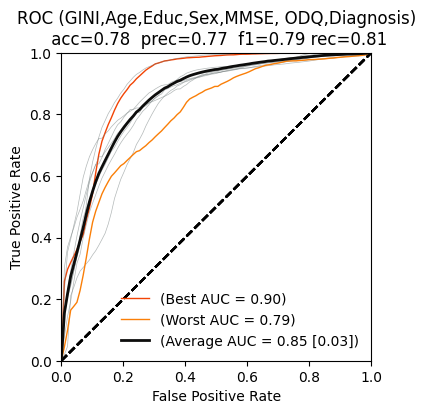

In [ ]:
plt.figure(figsize=(4,4))
graph_roc(gini_age_results, top_10_keys_GINI_age, title = 'GINI,Age,Educ,Sex,MMSE, ODQ,Diagnosis')


In [ ]:

df_metrics_dir_2 =  df_metrics_dir_.copy()
df_metrics_dir_2.replace({'negative': -1, 'positive': 1}, inplace=True)
df_metrics_dir_2.fillna(0, inplace=True)
df_metrics_dir_2

/tmp/ipython-input-1074529518.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_metrics_dir_2.replace({'negative': -1, 'positive': 1}, inplace=True)


,transitivity_mimat,transitivity_cmimat,transitivity_omat,global_efficiency_mimat,global_efficiency_cmimat,global_efficiency_omat,small_worldness_mimat,small_worldness_cmimat,small_worldness_omat
GINI,1,-1,-1,1,-1,-1,1,1,-1
Age,-1,-1,1,-1,-1,-1,-1,-1,1
Educ,-1,-1,-1,-1,-1,-1,-1,-1,-1
Sex,-1,-1,-1,-1,-1,-1,-1,-1,-1
MMSE,1,-1,1,1,-1,-1,1,-1,-1
Diagnosis,-1,-1,-1,-1,1,1,-1,1,-1
ODQ,-1,1,1,-1,1,1,1,1,1


In [ ]:
import pickle
with open(f'{base_path}df_metrics_dir_2.pkl', 'wb') as f: pickle.dump(df_metrics_dir_2, f)
with open(f'{base_path}df_metrics_pval_.pkl', 'wb') as f: pickle.dump(df_metrics_pval_, f)
with open(f'{base_path}df_metrics_slopes_.pkl', 'wb') as f: pickle.dump(df_metrics_slopes_, f)
with open(f'{base_path}gini_age_results.pkl', 'wb') as f: pickle.dump(gini_age_results, f)
with open(f'{base_path}top_10_keys_GINI_age.pkl', 'wb') as f: pickle.dump(top_10_keys_GINI_age, f)
with open(f'{base_path}df_metrics_correlation_.pkl', 'wb') as f: pickle.dump(df_metrics_correlation_, f)
with open(f'{base_path}df_metrics_slopes_todo_.pkl', 'wb') as f: pickle.dump(df_metrics_slopes_todo_, f)




In [ ]:


import pickle

# Cargar las variables desde los archivos
with open(f'{base_path}df_metrics_dir_2.pkl', 'rb') as f:
    df_metrics_dir_2 = pickle.load(f)

with open(f'{base_path}df_metrics_pval_.pkl', 'rb') as f:
    df_metrics_pval_ = pickle.load(f)

with open(f'{base_path}df_metrics_slopes_.pkl', 'rb') as f:
    df_metrics_slopes_ = pickle.load(f)


with open(f'{base_path}df_metrics_correlation_.pkl', 'rb') as f:
    df_metrics_correlation_ = pickle.load(f)

with open(f'{base_path}gini_age_results.pkl', 'rb') as f:
    gini_age_results = pickle.load(f)

with open(f'{base_path}top_10_keys_GINI_age.pkl', 'rb') as f:
    top_10_keys_GINI_age = pickle.load(f)



with open(f'{base_path}df_metrics_slopes_todo_.pkl', 'rb') as f:
    df_metrics_slopes_todo_ = pickle.load(f)

NameError: name 'base_path' is not defined

In [ ]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import pickle
import xlsxwriter
import os
import matplotlib.colors as mcolors
from tabulate import tabulate

# Assuming base_path is defined elsewhere in your notebook
# base_path = '/content/drive/MyDrive/your_path/'

with open(f'{base_path}df_metrics_slopes_todo_.pkl', 'rb') as f:
    df_metrics_slopes_todo_ = pickle.load(f)

# !pip install xlsxwriter # Assuming this is already installed from previous cells

# Instead of exploding columns individually, build a new list of records
expanded_records = []
for predictor_index, row in df_metrics_slopes_todo_.iterrows():
    predictor_name = predictor_index
    for outcome_column, slopes_data in row.items():

        if not isinstance(slopes_data, list):
            slopes_list = [slopes_data]
        else:
            slopes_list = slopes_data

        for slope_value in slopes_list:
            expanded_records.append({
                'Predictor': predictor_name,
                'Outcome': outcome_column,
                'Slope': slope_value
            })

df_expandido = pd.DataFrame(expanded_records)

print(df_expandido.head())



df_expandido['Slope'] = pd.to_numeric(df_expandido['Slope'], errors='coerce')


expected_directions = {
    'GINI': 'negative',
    'Age': 'negative',
    'Sex': 'negative',
    'Diagnosis': 'negative',
    'Educ': 'positive',
    'MMSE': 'positive',
    'ODQ': 'positive'
}


resultados_por_feature = {}

for outcome in df_expandido['Outcome'].unique():
    print(f"🔹 Procesando outcome: {outcome}")

    df_outcome = df_expandido[df_expandido['Outcome'] == outcome].copy() # Use .copy() to avoid SettingWithCopyWarning

    outcome_predictor_summary = {predictor: {'Correct': 0, 'Incorrect': 0, 'Total_models': 0} for predictor in df_outcome['Predictor'].unique()}

    for _, row in df_outcome.iterrows():
        predictor = row['Predictor']
        slope_val = row['Slope']

        expected = expected_directions.get(predictor, None)

        outcome_predictor_summary[predictor]['Total_models'] += 1

        if expected is not None and pd.notna(slope_val):
            if (expected == 'positive' and slope_val > 0) or \
               (expected == 'negative' and slope_val < 0):
                outcome_predictor_summary[predictor]['Correct'] += 1
            else:
                outcome_predictor_summary[predictor]['Incorrect'] += 1

    outcome_results_list = []
    for predictor, counts in outcome_predictor_summary.items():
        total_models_considered = counts['Total_models']
        modelos_correctos = counts['Correct']
        modelos_incorrectos = counts['Incorrect']
        porcentaje_correctos = (modelos_correctos / total_models_considered) * 100 if total_models_considered > 0 else 0
        porcentaje_incorrectos = (modelos_incorrectos / total_models_considered) * 100 if total_models_considered > 0 else 0

        outcome_results_list.append({
            "Predictor": predictor,
            "Modelos_correctos": modelos_correctos,
            "Total_modelos": total_models_considered,
            "Modelos_incorrectos": modelos_incorrectos,
            "Porcentaje_correctos": porcentaje_correctos,
            "Porcentaje_incorrectos": porcentaje_incorrectos
        })

    resultados_por_feature[outcome] = pd.DataFrame(outcome_results_list)


with pd.ExcelWriter(f'{base_path}porcentajes_correctos_por_featureXX.xlsx', engine="xlsxwriter") as writer:
    for outcome, df_resultados in resultados_por_feature.items():
        df_resultados.to_excel(writer, sheet_name=outcome, index=False)

        plot_features = df_resultados["Predictor"].tolist()
        accuracy_percentages = df_resultados["Porcentaje_correctos"].values
        incorrect_percentages = df_resultados["Porcentaje_incorrectos"].values

        if not plot_features: # Skip plotting if there are no features
            print(f"Skipping polar plot for outcome {outcome} as there are no contributing predictors.")
            continue

        accuracy_percentages = np.append(accuracy_percentages, accuracy_percentages[0])
        incorrect_percentages = np.append(incorrect_percentages, incorrect_percentages[0])

        num_vars = len(plot_features)
        angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
        angles += angles[:1]  # 🔹 Close the plot

        fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
        ax.fill(angles, accuracy_percentages, color='blue', alpha=0.3)
        ax.plot(angles, accuracy_percentages, color='blue', linewidth=2, linestyle='solid')

        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(plot_features, fontsize=10)
        ax.set_ylim(0, 100)
        ax.set_title(f'Direction Agreement for Outcome: {outcome}', va='bottom')
        ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))


        # 🔹 Save the figure
        plt.savefig(f'{base_path}/{outcome}_polarXX.svg', format="svg", dpi=300)
        plt.savefig(f'{base_path}/{outcome}_polarXX.pdf', format="pdf", dpi=300) # Save as PDF as well
        plt.close(fig) # Close the figure to free memory

print("✅ File 'porcentajes_correctos_por_featureXX.xlsx' generated correctly with tabs by feature (outcomes) and plots.")

  Predictor             Outcome     Slope
0      GINI  transitivity_mimat  0.411070
1      GINI  transitivity_mimat  0.436528
2      GINI  transitivity_mimat  0.389035
3      GINI  transitivity_mimat  0.453798
4      GINI  transitivity_mimat  0.330139
🔹 Procesando outcome: transitivity_mimat
🔹 Procesando outcome: transitivity_cmimat
🔹 Procesando outcome: transitivity_omat
🔹 Procesando outcome: global_efficiency_mimat
🔹 Procesando outcome: global_efficiency_cmimat
🔹 Procesando outcome: global_efficiency_omat
🔹 Procesando outcome: small_worldness_mimat
🔹 Procesando outcome: small_worldness_cmimat
🔹 Procesando outcome: small_worldness_omat


/tmp/ipython-input-3518154800.py:168: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
/tmp/ipython-input-3518154800.py:168: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
/tmp/ipython-input-3518154800.py:168: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
/tmp/ipython-input-3518154800.py:168: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argu

✅ File 'porcentajes_correctos_por_featureXX.xlsx' generated correctly with tabs by feature (outcomes) and plots.


In [ ]:
def extraer_valor_numerico_(s):
    if isinstance(s, bytes):
        s = s.decode("utf-8")


    s = str(s).replace("–", "-").strip()

    try:
        valor = float(s)
        print(f"Valor encontrado y correctamente interpretado: {valor}")
        return valor
    except ValueError:
        print("Error al convertir a número:", s)
        return None

In [ ]:
import re

def extraer_valor_numerico(s):

    if isinstance(s, bytes):
        s = s.decode('utf-8')

    s = str(s).replace("–", "-")



    match = re.search(r"([-+]?\d*\.\d+|\d+)", s)

    if match:
        print("Valor encontrado:", match.group(0))
        return float(match.group(0))
    else:
        print("No se encontró ningún valor numérico.")
        return None


In [ ]:
import matplotlib.pyplot as plt
!pip install matplotlib pandas xlsxwriter tabulate
import numpy as np
import pandas as pd
from tabulate import tabulate
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as patches
!pip install pandas
import pandas as pd
!pip install xlsxwriter
import os
import matplotlib.colors as mcolors


def graph_feat_impor_t2_S(df_metrics_dir, df_metrics_pval, df_metrics_slopes_,df_metrics_correlation_, gini_results_metric, top_10_keys_metric, gini_plus_var=True,  title=''):
    cantidad = 7
    count = 1
    page_number = 1
    ordered_features = ['GINI', 'Age', 'ODQ', 'Sex', 'Diagnosis', 'Educ', 'MMSE']


    variables_expectations = {
      'GINI': 'negative',
      'Age': 'negative',
      'Sex': 'negative',
      'Diagnosis': 'negative',
      'Educ': 'positive',
      'MMSE': 'positive',
      'ODQ': 'positive'
    }

    colors = ['blue', 'gray', 'green']

    nodes = [0.0, 0.5, 1.0]
    custom_cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", list(zip(nodes, colors)))

    summary_df = pd.DataFrame(columns=['Model', 'Correct (%)', 'Incorrect (%)'])
    correct_pred_df = pd.DataFrame(columns=['Model', 'Predictor'])
    incorrect_pred_df = pd.DataFrame(columns=['Model', 'Predictor'])


    normalized_correlations = {}


    global_min = -abs(df_metrics_correlation_.max().max())
    global_max = abs(df_metrics_correlation_.max().max())


    all_feature_outcomes = []  # Lista para almacenar los DataFrames de cada modelo


    writer = pd.ExcelWriter(f'{base_path}mugre.xlsx', engine='xlsxwriter')
    writer2 = pd.ExcelWriter(f'{base_path}mugre_.xlsx', engine='xlsxwriter')


    for i, key in enumerate(top_10_keys_metric):
        auc = np.mean(gini_results_metric[key][1]['test']['auc'])
        acc = np.mean(gini_results_metric[key][1]['test']['accuracy_score'])
        prec = np.mean(gini_results_metric[key][1]['test']['precision_score'])
        f1 = np.mean(gini_results_metric[key][1]['test']['f1_score'])
        rec = np.mean(gini_results_metric[key][1]['test']['recall_score'])

        auc_std = np.std(gini_results_metric[key][1]['test']['auc'])
        acc_std = np.std(gini_results_metric[key][1]['test']['accuracy_score'])
        prec_std = np.std(gini_results_metric[key][1]['test']['precision_score'])
        f1_std = np.std(gini_results_metric[key][1]['test']['f1_score'])
        rec_std = np.std(gini_results_metric[key][1]['test']['recall_score'])

        conf_matrix = gini_results_metric[key][1]['test']['confusion_matrix']
        conf_matrix_mean = np.mean(conf_matrix, axis=0)
        conf_matrix_std = np.std(conf_matrix, axis=0)

        fscore = {k: [] for k in ['GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'ODQ', 'Diagnosis']}
        model_idx = 0  # Para numerar los modelos
        model_summary = []





        for model in gini_results_metric[key][1]['test']['model']:


                model_fscore = model.get_fscore()

                model_features = list(model_fscore.keys())

                if gini_plus_var and len(model_features) < cantidad:
                    status = "Descartado"
                    print(f"-> Modelo #{model_idx} descartado (menos de {cantidad} features)")
                    model_idx += 1
                    model_summary.append({
                        "Key": key,
                        "Modelo": model_idx - 1,
                        "Estado": status,
                        "Cantidad_features": len(model_features),
                        "Features": ", ".join(model_features)
                    })
                    continue

                else:
                    status = "Incluido"
                    print(f"-> Modelo #{model_idx} incluido ✅")

                    for j in model_fscore.keys():
                        if gini_plus_var and len(model_fscore.keys()) < cantidad:
                            continue
                        if j in fscore:
                            fscore[j].append(model_fscore[j])
                        else:
                            fscore[j] = [model_fscore[j]]

                print(len(fscore))

                model_summary.append({
                    "Key": key,
                    "Modelo": model_idx,
                    "Estado": status,
                    "Cantidad_features": len(model_features),
                    "Features": ", ".join(model_features)
                })
                model_idx += 1


        df_models = pd.DataFrame(model_summary)

        df_models.to_excel(writer, sheet_name=str(key), index=False)



        index = ['Age', 'Educ', 'GINI', 'Sex', 'MMSE', 'ODQ', 'Diagnosis']

        feature_outcome = {feature: {'Correct': 0, 'Incorrect': 0} for feature in index}

        df = pd.DataFrame.from_dict(fscore, orient='index')
        df = df.transpose()

        if df.empty:
          continue

        for column in index:
            if column not in df.columns:
                df[column] = 0

        df[ordered_features] = df[ordered_features].fillna(0)

        plt.subplot(2, 4, count)
        mean_values = df.mean()
        std_values = df.std()


        if df_metrics_dir is not None:
            mean_values_filtered = mean_values.copy()
            for feature in mean_values.index:
                if feature in df_metrics_dir.index and key in df_metrics_dir.columns:
                    pval = df_metrics_pval.loc[feature, key]
                    mean_values_filtered[feature] = mean_values.get(feature, 1) * np.sign(df_metrics_dir.loc[feature, key])

            mean_values_filtered = mean_values_filtered.fillna(0)
            std_values = std_values.loc[mean_values_filtered.index]



            mean_values_filtered = mean_values_filtered.loc[ordered_features]
            std_values = std_values.loc[ordered_features]


            correlation_series = df_metrics_correlation_.loc[ordered_features, key]
            slope_series = df_metrics_slopes_.loc[ordered_features, key]

            # Listas para almacenar los valores numéricos extraídos
            correlation_values = []
            df_metrics_slopes_values = []

            for feature in ordered_features:
                correlation_str = correlation_series.loc[feature]
                slope_str = slope_series.loc[feature]



                if isinstance(correlation_str, (int, float, np.floating)):
                    correlation_str = str(correlation_str).replace("–", "-")

                if isinstance(slope_str, bytes):
                    slope_str = slope_str.decode('utf-8')

                try:
                    if isinstance(correlation_str, str):
                      print(f"Valor antes de procesar: {correlation_str}")
                      correlation_str = correlation_str.replace("–", "-")
                      correlation_value = extraer_valor_numerico_(correlation_str)
                      print(f"Después de extraer: {correlation_value}")



                    correlation_value = extraer_valor_numerico_(correlation_str)
                    slope_value = extraer_valor_numerico(slope_str)
                except ValueError:
                    correlation_value = None
                    slope_value = None


                correlation_values.append(correlation_value)
                df_metrics_slopes_values.append(slope_value)



                if pd.notna(correlation_value):
                    correlation_value = round(correlation_value, 6)

                    if correlation_value > 1:
                        correlation_value = 1


                        correlation_value = 1
                    elif correlation_value < -1:
                        correlation_value = -1



                        correlation_value = -1
                        print(df_metrics_correlation_)

                        correlation_values.append(correlation_value)
                        df_metrics_slopes_values.append(slope_value if pd.notna(slope_value) else None)
                else:
                    df_metrics_slopes_values.append(None)
                    correlation_values.append(None)

            print(mean_values_filtered)
            print(correlation_values)

            valid_correlations = [val for val in correlation_values if val is not None]



            color_list = ['green' if val > 0 else 'blue' if val < 0 else 'red' for val in mean_values_filtered]

            # Crear una colormap personalizada
            colors = [(0.5, 0, 0), (1, 1, 1), (1, 0.2, 0.2)]  # Rojo oscuro, blanco, rojo oscuro
            nodes = [0.0, 0.5, 1.0]
            red_cmap = mcolors.LinearSegmentedColormap.from_list("red_cmap", list(zip(nodes, colors)))

            # Crear un subplot y asignar a ax
            ax = plt.subplot(2, 4, count)

            correlation_min = -1  # Valor mínimo de correlación
            correlation_max = 1   # Valor máximo de correlación
            norm = plt.Normalize(correlation_min, correlation_max)
            sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm)
            sm.set_array([])  # Necesario para que funcione en algunas versiones de matplotlib



            red_norm = plt.Normalize(-1, 1)  # Ajusta este rango según lo que necesites
            red_sm = plt.cm.ScalarMappable(cmap=red_cmap, norm=red_norm)
            red_sm.set_array([])

            for feature, correlation_value in zip(mean_values_filtered.index, correlation_values):
                    print(f"Métrica: {key}, Característica: {feature}, Correlación: {correlation_value}")

           # Inicialización de listas
            negative_blue = set()
            positive_green = set()

            # Definir expectativas de las variables
            variables_expectations = {
                'GINI': 'negative',
                'Age': 'negative',
                'Sex': 'negative',
                'Diagnosis': 'negative',
                'Educ': 'positive',
                'MMSE': 'positive',
                'ODQ': 'positive'
            }

            metrics_expectations = {
                'transitivity_mimat': 'positive',
                'transitivity_cmimat': 'positive',
                'transitivity_omat': 'positive',

                'global_efficiency_mimat': 'negative',
                'global_efficiency_cmimat': 'negative',
                'global_efficiency_omat': 'negative',

                'small_worldness_mimat': 'negative',
                'small_worldness_cmimat': 'negative',
                'small_worldness_omat': 'negative',

                'Age': 'negative'
            }





            print("Valores de correlación:")
            for feature, correlation_value,slope in zip(mean_values_filtered.index, correlation_values,df_metrics_slopes_values):
                        print(f"Métrica: {key}, Característica: {feature}, Correlación: {correlation_value}, Pendiente:{slope}" )


            incorrect_counts = {feature: 0 for feature in mean_values_filtered.index}

            correlation_per_feature = {feature: [] for feature in mean_values_filtered.index}

            #####antes
            # Rellenar listas basadas en las expectativas de variables
            for feature, value, error in zip(mean_values_filtered.index, mean_values_filtered.values, std_values.values):
                idx = mean_values_filtered.index.get_loc(feature)
                correlation_value = correlation_values[idx]
                df_metrics_slopes_value = df_metrics_slopes_values[idx]

                print(f"Procesando: {feature}, Valor: {value}, Error: {error}, Correlación: {correlation_value}, Slopewwww: {df_metrics_slopes_value}")

                 # Comprobar si la clave está en metrics_expectations

                if key in metrics_expectations and feature=='Age':
                    expectation = metrics_expectations[feature]
                else:
                    expectation = variables_expectations.get(feature, None)  # Usar la expectativa general o 'negative' por defecto



                # Clasificación
                if expectation == 'positive':
                    positive_green.add(feature)
                else:
                    negative_blue.add(feature)

                print(f"Expectativa: {expectation} para {feature}")



                print('negative_blue',negative_blue)
                print('positive_green',positive_green)


                print(f"Procesandoooooo: {feature}, Expectativa: {expectation}, Valor de correlación: {correlation_value}")

                correctos = []
                incorrectos = []
                aux = 0
                aux2 = 0


                epsilon = 1e-6
                try:
                  df_metrics_slopes_value = float(df_metrics_slopes_value)
                except ValueError:
                  df_metrics_slopes_value = np.nan  # o manejar como prefieras
                  # Verificar si la dirección del efecto es correcta según la pendiente
                if correlation_value is not None and not np.isnan(df_metrics_slopes_value):
                    print("ahhhh",df_metrics_slopes_value)
                    if (expectation == 'positive' and df_metrics_slopes_value > 0) or \
                       (expectation == 'negative' and df_metrics_slopes_value < 0):
                         correlation_per_feature[feature].append(correlation_value)
                         feature_outcome[feature]['Correct'] += 1
                    else:
                         feature_outcome[feature]['Incorrect'] += 1
                feature_outcome_df = pd.DataFrame.from_dict(feature_outcome, orient='index').reset_index()
                feature_outcome_df.rename(columns={'index': 'Feature'}, inplace=True)

                # Agregar una columna con el modelo actual
                feature_outcome_df['Model'] = key  # 'key' corresponde al modelo actual del bucle

                # Agregar este DataFrame a la lista
                all_feature_outcomes.append(feature_outcome_df)


                # Consolidar todos los resultados en un solo DataFrame

            all_avg_corrs = [np.mean(correlation_per_feature[f]) for f in correlation_per_feature if correlation_per_feature[f]]

            abs_max = max(abs(np.nanmin(all_avg_corrs)), abs(np.nanmax(all_avg_corrs)))

            correlation_min = -abs_max
            correlation_max = abs_max

            # Normalizador para el mapa de color
            norm = plt.Normalize(global_min, global_max)
            sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm)
            sm.set_array([])  # A veces necesario para que funcione bien con colorbar
            ####

            for feature in mean_values_filtered.index:
                avg_correct_corr = np.mean(correlation_per_feature[feature]) if correlation_per_feature[feature] else np.nan
                print(f"kkkkk",correlation_per_feature[feature])
                print(f"Promedio de correlación correcta para {feature}: {avg_correct_corr}")

                if not np.isnan(avg_correct_corr):
                    color = sm.to_rgba(avg_correct_corr)  # Verde o azul según intensidad
                else:
                    color = 'white'
                print(f"Color final para {feature}: {color}")

                plt.barh(feature, abs(mean_values_filtered[feature]), xerr=std_values[feature], capsize=4, color=color, align='center', edgecolor='black')
                print(f"Color final para {feature}: {color}")



            # Añadir la barra de color
            plt.colorbar(sm, ax=plt.gca(), label='Correlation Coefficient')


            # Graficar valores positivos y negativos


        ax = plt.gca()
        ax.set_xlim(left=0)#


        writer.close()

        plt.axvline(x=0, color='black', linestyle='--')
        plt.ylabel('Features')
        plt.xlabel('Estimate')
        plt.title(f'{key}\n auc={auc:.2f} accuracy={acc:.2f} precision={prec:.2f} \n f1={f1:.2f} recall={rec:.2f}')

        plt.subplot(2, 4, count + 4)
        plt.imshow(conf_matrix_mean, interpolation='nearest', cmap=plt.cm.Greys)
        plt.title(f'{key}')
        plt.colorbar()

        tick_marks = np.arange(len(['Low', 'High']))
        plt.xticks(tick_marks, ['Low', 'High'])
        plt.yticks(tick_marks, ['Low', 'High'])
        plt.ylabel('True')
        plt.xlabel('Predict')

        for row in range(conf_matrix_mean.shape[0]):
            for col in range(conf_matrix_mean.shape[1]):
                plt.text(col, row, f"{conf_matrix_mean[row, col]:.2f}\n({conf_matrix_std[row, col]:.2f})",
                         ha="center", va="center", color="white" if conf_matrix_mean[row, col] > 30 else "black")

        visible_features = [
            feature for feature in mean_values_filtered.index
            if not np.isnan(mean_values_filtered[feature])
        ]

        correct_visible_features = [
            feature for feature in visible_features
            if (feature in positive_green and mean_values_filtered[feature] > 0) or
               (feature in negative_blue and mean_values_filtered[feature] < 0)
        ]

        incorrect_visible_features = [
            feature for feature in visible_features
            if (feature in positive_green and mean_values_filtered[feature] < 0) or
               (feature in negative_blue and mean_values_filtered[feature] > 0)
        ]



        correct_visible_count = len(correct_visible_features)
        incorrect_visible_count = len(incorrect_visible_features)

        total_visible_count = correct_visible_count + incorrect_visible_count
        correct_visible_pct = (correct_visible_count / total_visible_count * 100) if total_visible_count > 0 else 0
        incorrect_visible_pct = (incorrect_visible_count / total_visible_count * 100) if total_visible_count > 0 else 0

        summary_df = pd.concat([summary_df,
                               pd.DataFrame({
                                   'Model': [key],
                                   'Correct (Blue)': [len([feature for feature in correct_visible_features if feature in negative_blue])],
                                   'Incorrect (Blue)': [len([feature for feature in incorrect_visible_features if feature in negative_blue])],
                                   'Correct (Orange)': [len([feature for feature in correct_visible_features if feature in positive_green])],
                                   'Incorrect (Orange)': [len([feature for feature in incorrect_visible_features if feature in positive_green])],
                                   'Correct (%)': [correct_visible_pct],
                                   'Incorrect (%)': [incorrect_visible_pct]
                               })
                              ],ignore_index=True)

        for feature in correct_visible_features:
            correct_pred_df = pd.concat([correct_pred_df, pd.DataFrame([{'Model': key, 'Predictor': feature}])], ignore_index=True)
        for feature in incorrect_visible_features:
            incorrect_pred_df = pd.concat([incorrect_pred_df, pd.DataFrame([{'Model': key, 'Predictor': feature}])], ignore_index=True)



        count += 1

        metrics = {
            'AUC': [auc, auc_std],
            'Accuracy': [acc, acc_std],
            'Precision': [prec, prec_std],
            'F1 Score': [f1, f1_std],
            'Recall': [rec, rec_std]
        }
        df_metrics = pd.DataFrame(metrics, index=['Mean', 'STD'])

        mean_fscore = df.mean()
        std_fscore = df.std()
        fscores_ = pd.DataFrame({'mean': mean_fscore, 'SD': std_fscore})

        df_conf_m = pd.DataFrame(conf_matrix_mean, index=['Low', 'High'], columns=['Low', 'High'])
        df_conf_s = pd.DataFrame(conf_matrix_std, index=['Low', 'High'], columns=['Low', 'High'])

        with pd.ExcelWriter(f'{base_path}/conect_GINI_{title}_rank_{count - 1}_{key}.xlsx', engine='xlsxwriter') as writer:
            df_metrics.to_excel(writer, sheet_name='metrics')
            fscores_.to_excel(writer, sheet_name='fscores')
            df_conf_m.to_excel(writer, sheet_name='conf_mat_mean')
            df_conf_s.to_excel(writer, sheet_name='conf_mat_std')

        if count % 4 == 0  or (i == len(top_10_keys_metric) - 1):
          plt.tight_layout()
          plt.savefig(f'{base_path}figure_{title}_page_{i//4 + 1}.pdf', format='pdf')
          plt.savefig(f'{base_path}figure_{title}_page_{i//4 + 1}.svg', format='svg')
          plt.show()
          plt.figure(figsize=(20, 10))  # Ajusta el tamaño si es necesario
          count = 1  # Reiniciar el contador para la nueva figura
          print(f'Nuevo inicio de figura, count reiniciado: {count}')


    plt.tight_layout()
    plt.savefig(f'{base_path}figure_{title}_.svg', format='svg', facecolor='white')
    plt.savefig(f'{base_path}figure_{title}_.pdf', format='pdf', facecolor='white')
    plt.show()  # Asegura que se muestren los gráficos antes de cerrar la figura
    plt.close()


    predictor_summary = {predictor: {'Correct': 0, 'Incorrect': 0} for predictor in variables_expectations.keys()}

    for feature in mean_values_filtered.index:
        correlation_value = correlation_values[mean_values_filtered.index.get_loc(feature)]
        expectation = variables_expectations.get(feature, None)

        if expectation:
            if (expectation == 'positive' and correlation_value >= 0) or (expectation == 'negative' and correlation_value <= 0):
                predictor_summary[feature]['Correct'] += 1
            else:
                predictor_summary[feature]['Incorrect'] += 1

    predictor_summary_df = pd.DataFrame.from_dict(predictor_summary, orient='index').reset_index()
    predictor_summary_df.rename(columns={'index': 'Predictor'}, inplace=True)

    with pd.ExcelWriter(f'{base_path}summary_{title}.xlsx', engine='xlsxwriter') as writer:
        summary_df.to_excel(writer, sheet_name='summary', index=False)
        correct_pred_df.to_excel(writer, sheet_name='correct_predictors', index=False)
        incorrect_pred_df.to_excel(writer, sheet_name='incorrect_predictors', index=False)
        predictor_summary_df.to_excel(writer, sheet_name='predictor_summary', index=False)

    print("\nPredictor Summary Table:")
    print(tabulate(predictor_summary_df, headers='keys', tablefmt='grid', showindex=False))



-> Modelo #0 descartado (menos de 7 features)
-> Modelo #1 descartado (menos de 7 features)
-> Modelo #2 descartado (menos de 7 features)
-> Modelo #3 descartado (menos de 7 features)
-> Modelo #4 descartado (menos de 7 features)
-> Modelo #5 descartado (menos de 7 features)
-> Modelo #6 descartado (menos de 7 features)
-> Modelo #7 descartado (menos de 7 features)
-> Modelo #8 descartado (menos de 7 features)
-> Modelo #9 descartado (menos de 7 features)
-> Modelo #10 descartado (menos de 7 features)
-> Modelo #11 descartado (menos de 7 features)
-> Modelo #12 descartado (menos de 7 features)
-> Modelo #13 descartado (menos de 7 features)
-> Modelo #14 descartado (menos de 7 features)
-> Modelo #15 descartado (menos de 7 features)
-> Modelo #16 descartado (menos de 7 features)
-> Modelo #17 descartado (menos de 7 features)
-> Modelo #18 descartado (menos de 7 features)
-> Modelo #19 descartado (menos de 7 features)
-> Modelo #20 descartado (menos de 7 features)
-> Modelo #21 descartad

/tmp/ipython-input-21093005.py:784: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  summary_df = pd.concat([summary_df,
/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


Color final para Sex: (np.float64(0.3425144175317186), np.float64(0.3425144175317186), np.float64(0.6601614763552479), np.float64(1.0))
kkkkk [-0.04592699907958158]
Promedio de correlación correcta para Diagnosis: -0.04592699907958158
Color final para Diagnosis: (np.float64(0.3503883121876201), np.float64(0.3503883121876201), np.float64(0.6523490965013456), np.float64(1.0))
Color final para Diagnosis: (np.float64(0.3503883121876201), np.float64(0.3503883121876201), np.float64(0.6523490965013456), np.float64(1.0))
kkkkk []
Promedio de correlación correcta para Educ: nan
Color final para Educ: white
Color final para Educ: white
kkkkk [0.047594808532997065]
Promedio de correlación correcta para MMSE: 0.047594808532997065
Color final para MMSE: (np.float64(0.3425144175317186), np.float64(0.5019607843137255), np.float64(0.3425144175317186), np.float64(1.0))
Color final para MMSE: (np.float64(0.3425144175317186), np.float64(0.5019607843137255), np.float64(0.3425144175317186), np.float64(1.0)

/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


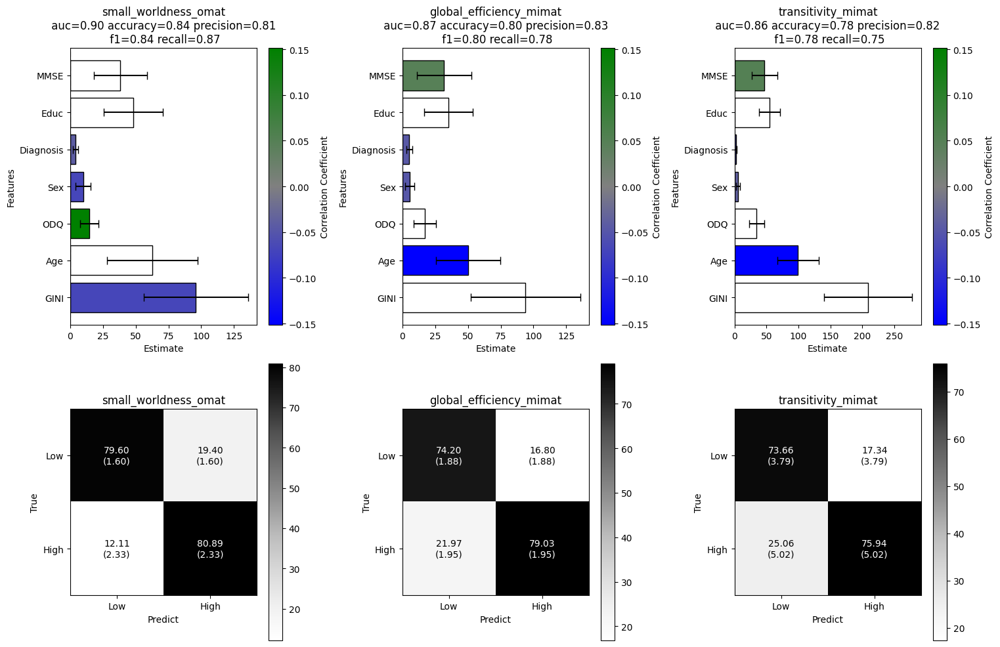

Nuevo inicio de figura, count reiniciado: 1
-> Modelo #0 descartado (menos de 7 features)
-> Modelo #1 incluido ✅
7
-> Modelo #2 incluido ✅
7
-> Modelo #3 incluido ✅
7
-> Modelo #4 incluido ✅
7
-> Modelo #5 incluido ✅
7
-> Modelo #6 descartado (menos de 7 features)
-> Modelo #7 incluido ✅
7
-> Modelo #8 incluido ✅
7
-> Modelo #9 incluido ✅
7
-> Modelo #10 incluido ✅
7
-> Modelo #11 incluido ✅
7
-> Modelo #12 incluido ✅
7
-> Modelo #13 incluido ✅
7
-> Modelo #14 incluido ✅
7
-> Modelo #15 incluido ✅
7
-> Modelo #16 descartado (menos de 7 features)
-> Modelo #17 incluido ✅
7
-> Modelo #18 incluido ✅
7
-> Modelo #19 descartado (menos de 7 features)
-> Modelo #20 incluido ✅
7
-> Modelo #21 incluido ✅
7
-> Modelo #22 descartado (menos de 7 features)
-> Modelo #23 incluido ✅
7
-> Modelo #24 descartado (menos de 7 features)
-> Modelo #25 descartado (menos de 7 features)
-> Modelo #26 incluido ✅
7
-> Modelo #27 incluido ✅
7
-> Modelo #28 incluido ✅
7
-> Modelo #29 incluido ✅
7
-> Modelo #30 in

/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")
/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


-> Modelo #0 incluido ✅
7
-> Modelo #1 incluido ✅
7
-> Modelo #2 incluido ✅
7
-> Modelo #3 incluido ✅
7
-> Modelo #4 incluido ✅
7
-> Modelo #5 incluido ✅
7
-> Modelo #6 incluido ✅
7
-> Modelo #7 descartado (menos de 7 features)
-> Modelo #8 incluido ✅
7
-> Modelo #9 descartado (menos de 7 features)
-> Modelo #10 incluido ✅
7
-> Modelo #11 descartado (menos de 7 features)
-> Modelo #12 incluido ✅
7
-> Modelo #13 descartado (menos de 7 features)
-> Modelo #14 incluido ✅
7
-> Modelo #15 descartado (menos de 7 features)
-> Modelo #16 incluido ✅
7
-> Modelo #17 incluido ✅
7
-> Modelo #18 incluido ✅
7
-> Modelo #19 incluido ✅
7
-> Modelo #20 incluido ✅
7
-> Modelo #21 incluido ✅
7
-> Modelo #22 incluido ✅
7
-> Modelo #23 incluido ✅
7
-> Modelo #24 incluido ✅
7
-> Modelo #25 incluido ✅
7
-> Modelo #26 incluido ✅
7
-> Modelo #27 incluido ✅
7
-> Modelo #28 incluido ✅
7
-> Modelo #29 descartado (menos de 7 features)
-> Modelo #30 incluido ✅
7
-> Modelo #31 descartado (menos de 7 features)
-> Mod

/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


mmmmmmm ['Diagnosis', 'Educ', 'MMSE']
kkk GINI        -216.481481
Age         -247.277778
ODQ           43.907407
Sex          -35.296296
Diagnosis      2.240741
Educ        -116.333333
MMSE        -115.462963
dtype: float64


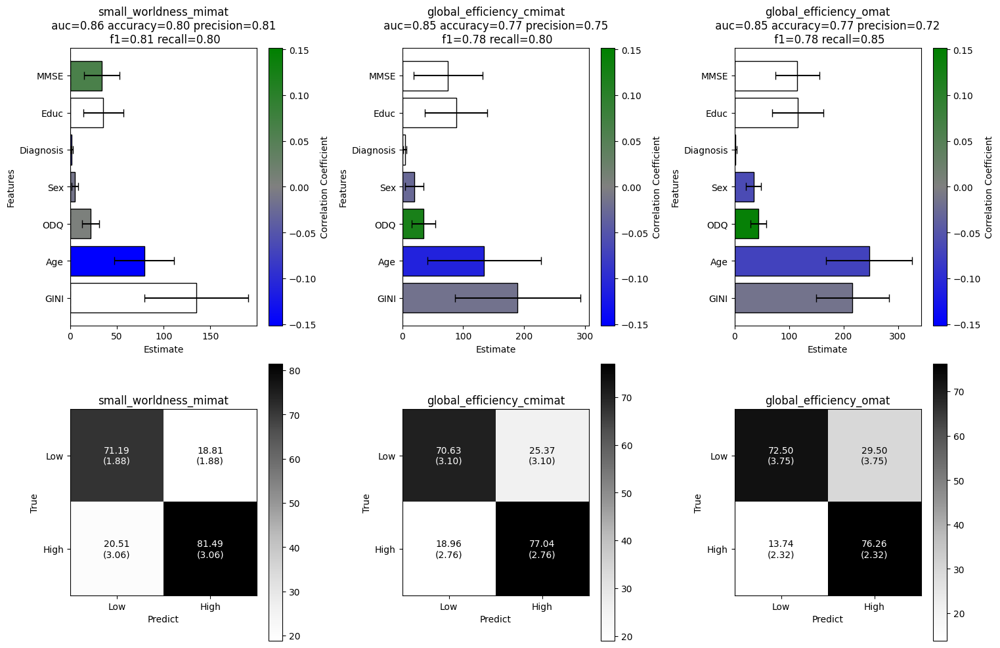

Nuevo inicio de figura, count reiniciado: 1
-> Modelo #0 descartado (menos de 7 features)
-> Modelo #1 descartado (menos de 7 features)
-> Modelo #2 descartado (menos de 7 features)
-> Modelo #3 descartado (menos de 7 features)
-> Modelo #4 descartado (menos de 7 features)
-> Modelo #5 descartado (menos de 7 features)
-> Modelo #6 descartado (menos de 7 features)
-> Modelo #7 descartado (menos de 7 features)
-> Modelo #8 descartado (menos de 7 features)
-> Modelo #9 descartado (menos de 7 features)
-> Modelo #10 descartado (menos de 7 features)
-> Modelo #11 descartado (menos de 7 features)
-> Modelo #12 descartado (menos de 7 features)
-> Modelo #13 descartado (menos de 7 features)
-> Modelo #14 descartado (menos de 7 features)
-> Modelo #15 descartado (menos de 7 features)
-> Modelo #16 descartado (menos de 7 features)
-> Modelo #17 descartado (menos de 7 features)
-> Modelo #18 descartado (menos de 7 features)
-> Modelo #19 descartado (menos de 7 features)
-> Modelo #20 descartado (

/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


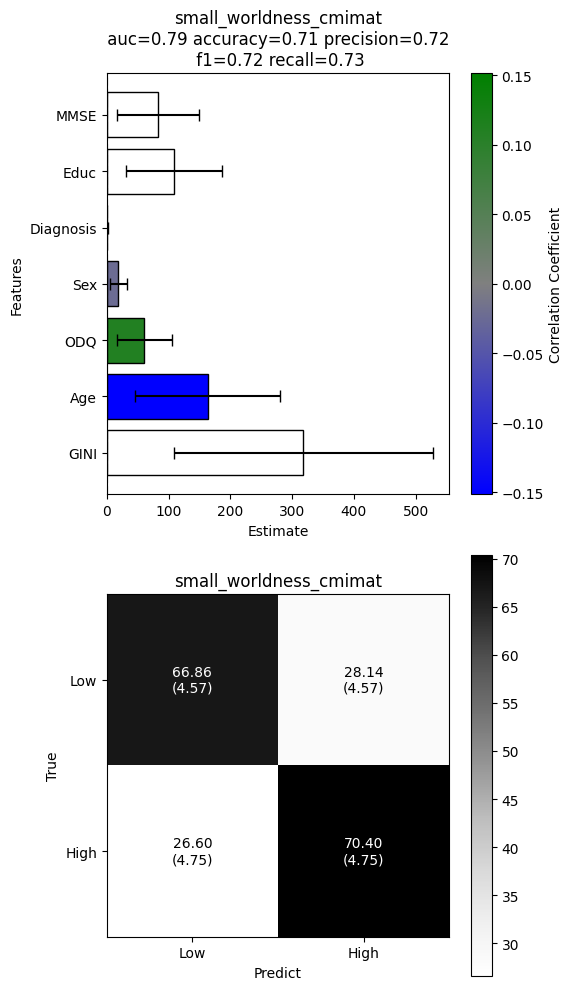

Nuevo inicio de figura, count reiniciado: 1


<Figure size 2000x1000 with 0 Axes>


Predictor Summary Table:
+-------------+-----------+-------------+
| Predictor   |   Correct |   Incorrect |
+=============+===========+=============+
| GINI        |         0 |           1 |
+-------------+-----------+-------------+
| Age         |         1 |           0 |
+-------------+-----------+-------------+
| Sex         |         1 |           0 |
+-------------+-----------+-------------+
| Diagnosis   |         0 |           1 |
+-------------+-----------+-------------+
| Educ        |         0 |           1 |
+-------------+-----------+-------------+
| MMSE        |         0 |           1 |
+-------------+-----------+-------------+
| ODQ         |         1 |           0 |
+-------------+-----------+-------------+


In [ ]:
plt.figure(figsize=(20,10))


graph_feat_impor_t2_S(df_metrics_dir_2,df_metrics_pval_,df_metrics_slopes_,df_metrics_correlation_,gini_age_results, top_10_keys_GINI_age, gini_plus_var=True, title = '+ Age,Educ,GINI,Sex,MMSE,Diagnosis,ODQ')


In [ ]:
!pip install xlsxwriter


import pandas as pd
import numpy as np
import pickle
import xlsxwriter
import matplotlib.pyplot as plt

# Cargar el DataFrame
with open(f'{base_path}df_metrics_slopes_todo_.pkl', 'rb') as f:
    df_metrics_slopes_todo_ = pickle.load(f)

# Expansión del DataFrame
expanded_records = []
for predictor_index, row in df_metrics_slopes_todo_.iterrows():
    predictor_name = predictor_index
    for outcome_column, slopes_data in row.items():
        slopes_list = slopes_data if isinstance(slopes_data, list) else [slopes_data]
        for slope_value in slopes_list:
            expanded_records.append({
                'Predictor': predictor_name,
                'Outcome': outcome_column,
                'Slope': slope_value
            })

df_expandido = pd.DataFrame(expanded_records)
df_expandido['Slope'] = pd.to_numeric(df_expandido['Slope'], errors='coerce')

variables_expectations = {
    'GINI': 'negative',
    'Age': 'negative',
    'Sex': 'negative',
    'Diagnosis': 'negative',
    'Educ': 'positive',
    'MMSE': 'positive',
    'ODQ': 'positive'
}

metrics_expectations = {

    'transitivity_mimat': 'positive',
    'transitivity_cmimat': 'positive',
    'transitivity_omat': 'positive',


    'global_efficiency_mimat': 'negative',
    'global_efficiency_cmimat': 'negative',
    'global_efficiency_omat': 'negative',


    'small_worldness_mimat': 'negative',
    'small_worldness_cmimat': 'negative',
    'small_worldness_omat': 'negative',


    'Age': 'negative'
}


expected_directions = {**variables_expectations, **metrics_expectations}


resultados_por_feature = {}
for outcome in df_expandido['Outcome'].unique():
    df_outcome = df_expandido[df_expandido['Outcome'] == outcome].copy()
    outcome_predictor_summary = {predictor: {'Correct': 0, 'Incorrect': 0, 'Total_models': 0} for predictor in df_outcome['Predictor'].unique()}

    for _, row in df_outcome.iterrows():
        predictor, slope_val = row['Predictor'], row['Slope']
        expected = expected_directions.get(predictor, None)


        if predictor == 'Age':
            expected = metrics_expectations.get(outcome, 'negative')



        print(f'Outcome: {outcome}, Predictor: {predictor}, Expected Direction: {expected}')



        outcome_predictor_summary[predictor]['Total_models'] += 1
        if expected and pd.notna(slope_val):
            if (expected == 'positive' and slope_val > 0) or (expected == 'negative' and slope_val < 0):
                outcome_predictor_summary[predictor]['Correct'] += 1
            else:
                outcome_predictor_summary[predictor]['Incorrect'] += 1

    outcome_results_list = [
        {"Predictor": predictor, "Modelos_correctos": counts['Correct'],
         "Total_modelos": counts['Total_models'], "Modelos_incorrectos": counts['Incorrect'],
         "Porcentaje_correctos": (counts['Correct'] / counts['Total_models']) * 100 if counts['Total_models'] > 0 else 0,
         "Porcentaje_incorrectos": (counts['Incorrect'] / counts['Total_models']) * 100 if counts['Total_models'] > 0 else 0}
        for predictor, counts in outcome_predictor_summary.items()
    ]

    resultados_por_feature[outcome] = pd.DataFrame(outcome_results_list)


with pd.ExcelWriter(f'{base_path}porcentajes_correctos_por_featureXX_9.xlsx', engine="xlsxwriter") as writer:
    for outcome, df_resultados in resultados_por_feature.items():
        df_resultados.to_excel(writer, sheet_name=outcome, index=False)

        plot_features = df_resultados["Predictor"].tolist()
        accuracy_percentages = df_resultados["Porcentaje_correctos"].values
        incorrect_percentages = df_resultados["Porcentaje_incorrectos"].values

        if not plot_features:
            print(f"Skipping polar plot for outcome {outcome} as there are no contributing predictors.")
            continue

        accuracy_percentages = np.append(accuracy_percentages, accuracy_percentages[0])
        incorrect_percentages = np.append(incorrect_percentages, incorrect_percentages[0])

        num_vars = len(plot_features)
        angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
        angles += angles[:1]

        fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
        ax.fill(angles, accuracy_percentages, color='blue', alpha=0.3)
        ax.plot(angles, accuracy_percentages, color='blue', linewidth=2, linestyle='solid')

        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(plot_features, fontsize=10)
        ax.set_ylim(0, 100)
        ax.set_title(f'Direction Agreement for Outcome: {outcome}', va='bottom')
        ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

        plt.savefig(f'{base_path}/{outcome}_polarXX_.svg', format="svg", dpi=300)
        plt.savefig(f'{base_path}/{outcome}_polarXX_.pdf', format="pdf", dpi=300)
        plt.close(fig)



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.3/175.3 kB 14.0 MB/s eta 0:00:00


NameError: name 'base_path' is not defined